<a href="https://colab.research.google.com/github/AbigailMRod/GANsDL.AI/blob/main/FirstGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# GAN

En este cuaderno, se va a crear una red antagónica generativa (GAN).
Específicamente, se construirá y entrenará una GAN que puede generar imágenes escritas a mano de dígitos (0-9) utilizando PyTorch.

## Objetivos
*   Construir los componentes generador y discriminador de una GAN desde cero.
*   Crear funciones de pérdida de generador y discriminador
*   Entrenar la GAN y visualizar las imágenes generadas




### Comenzando
Importar algunos paquetes útiles y el conjunto de datos que se usarán para construir y entrenar la GAN. También se le proporciona una función de visualizador para ayudar a investigar las imágenes que creará la GAN.

In [ ]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Conjunto de datos de entrenamiento
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Establecer semilla para fines de prueba

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Función de visualización de imágenes: Dado un tensor de imágenes, número de imágenes y
    tamaño por imagen, traza e imprime las imágenes en una cuadrícula uniforme.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

#### MNIST Dataset
Las imágenes de entrenamiento que usará el discriminador provienen de un conjunto de datos llamado [MNIST](http://yann.lecun.com/exdb/mnist/). Contiene 60.000 imágenes de dígitos escritos a mano, del 0 al 9, como estos:

<img src="https://upload.wikimedia.org/wikipedia/commons/2/27/MnistExamples.png">

Las imágenes están bastante pixeladas, ¡esto se debe a que todas tienen solo 28 x 28! El pequeño tamaño de sus imágenes hace que MNIST sea ideal para un entrenamiento sencillo. Además, estas imágenes también están en blanco y negro, por lo que solo se necesita una dimensión, o "canal de color", para representarlas.

#### Tensor
Se representarán los datos usando [tensores](https://pytorch.org/docs/stable/tensors.html). Los tensores son una generalización de matrices: por ejemplo, una pila de tres matrices con las cantidades de rojo, verde y azul en diferentes ubicaciones en una imagen de 64 x 64 píxeles es un tensor con la forma 3 x 64 x 64.

Los tensores son fáciles de manipular y son compatibles con [PyTorch](https://pytorch.org/), la biblioteca de aprendizaje automático que se utilizará. 

#### Batches
Si bien se podrian entrenar los modelo después de generar una imagen, es extremadamente ineficiente y conduce a un entrenamiento menos estable. En las GAN y en el aprendizaje automático en general, se procesan varias imágenes por paso de entrenamiento. Estos se llaman lotes (batches).

Esto significa que el generador generará un lote completo de imágenes y recibirá la retroalimentación del discriminador sobre cada una antes de actualizar el modelo. Lo mismo ocurre con el discriminador, calculará su pérdida en todo el lote de imágenes generadas, así como en los reales antes de que se actualice el modelo.

## Generador
El primer paso es construir el componente generador.

Se comenzará creando una función para crear una sola capa/bloque para la red neuronal del generador. Cada bloque debe incluir una [transformación lineal](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) para asignar a otra forma, una [normalización por lotes](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) para la estabilización y, finalmente, una función de activación no lineal [ReLU](https://pytorch.org/docs/master/generated/torch.nn.ReLU.html) para que la salida se pueda transformar de formas complejas.

In [ ]:
# get_generator_block
def get_generator_block(input_dim, output_dim):
    '''
    Función para devolver un bloque de la red neuronal del generador
    con dimensiones dadas de entrada y salida.
    Parámetros:
        input_dim: la dimensión del vector de entrada, un escalar
        output_dim: la dimensión del vector de salida, un escalar
    Return:
        una capa de red neuronal generadora, con una transformación lineal
        seguido de una normalización por lotes y luego una activación relu
    '''
    return nn.Sequential(
        # La documentación puede ser útil si está menos familiarizado con PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        #### END CODE HERE ####
        nn.ReLU(inplace=True)
    )

In [ ]:
# Verificar la función del bloque generador
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Revisar las tres partes
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Comprobar la forma de la salida
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")


Success!


Ahora se puede construir la clase generadora. Tomará 3 valores:

* La dimensión del vector de ruido
* La dimensión de la imagen
* La dimensión oculta inicial

Usando estos valores, el generador construirá una red neuronal con 5 capas/bloques. Comenzando con el vector de ruido, el generador aplicará transformaciones no lineales a través de la función de bloque hasta que el tensor se asigne al tamaño de la imagen que se generará (el mismo tamaño que las imágenes reales de MNIST). Deberá completar el código para la capa final, ya que es diferente a los demás. La capa final no necesita una función de normalización o activación, pero sí debe escalarse con una [función sigmoide](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html).

Finalmente, se le proporciona una función de paso hacia adelante que toma un vector de ruido y genera una imagen de la dimensión de salida utilizando su red neuronal.

In [ ]:
# FUNCION: Generador
class Generator(nn.Module):
    '''
    Clase de generador
     Valores:
        z_dim: la dimensión del vector de ruido, un escalar
        im_dim: la dimensión de las imágenes, ajustada para el conjunto de datos utilizado, un escalar
           (Las imágenes MNIST son 28 x 28 = 784, por lo que es su valor predeterminado)
        hidden_dim: la dimensión interna, un escalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Construir la red neuronal
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            #### START CODE HERE ####
            nn.Linear(hidden_dim*8, im_dim),
            nn.Sigmoid()
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Función para completar un paso hacia adelante del generador: Dado un tensor de ruido,
        devuelve las imágenes generadas.
        Parámetros:
             noise: un tensor de ruido con dimensiones (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    def get_gen(self):
        '''
        Returns:
            el modelo secuencial 
        '''
        return self.gen

In [ ]:
# Verificar la clase del generador
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Comprueba que hay seis módulos en la parte secuencial.
    assert len(gen) == 6
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Verifique que la forma de salida sea correcta
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Asegúrate de usar una sigmoide"
    assert test_output.min() > 0, "Asegúrate de usar una sigmoide"
    assert test_output.min() < 0.5, "No use un bloque en su solución"
    assert test_output.std() > 0.05, "No use la norma por lotes aquí"
    assert test_output.std() < 0.15, "No use la norma por lotes aquí"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


## Ruido (Noise)
Para poder usar el generador, deberá poder crear vectores de ruido. El vector de ruido z tiene la importante función de asegurarse de que las imágenes generadas a partir de la misma clase no se vean todas iguales; piense en ello como una semilla aleatoria. Lo generará aleatoriamente usando PyTorch al muestrear números aleatorios de la distribución normal. Dado que se procesarán varias imágenes por pasada, generará todos los vectores de ruido a la vez.

Tenga en cuenta que cada vez que crea un nuevo tensor usando torch.ones, torch.zeros o torch.randn, debe crearlo en el dispositivo de destino, p. `torch.ones(3, 3, device=device)`, o muévalo al dispositivo objetivo usando `torch.ones(3, 3).to(device)`. No necesita hacer esto si está creando un tensor manipulando otro tensor o usando una variación que predetermina el dispositivo a la entrada, como `torch.ones_like`. En general, use `torch.ones_like` y `torch.zeros_like` en lugar de `torch.ones` o `torch.zeros` cuando sea posible.

In [ ]:
# FUNCION: get_noise
def get_noise(n_samples, z_dim, device='cuda'):
    '''
    Función para crear vectores de ruido: Dadas las dimensiones (n_samples, z_dim),
    crea un tensor de esa forma lleno de números aleatorios de la distribución normal.
     Parámetros:
         n_samples: el número de muestras a generar, un escalar
         z_dim: la dimensión del vector de ruido, un escalar
         device: el tipo de dispositivo
    '''
    # NOTA: Para usar esto en GPU con device='cuda', asegúrese de pasar el argumento 
    # de la función que usa para generar el ruido.
    #### START CODE HERE ####
    return torch.randn(n_samples, z_dim, device=device)
    #### END CODE HERE ####

In [ ]:
# Verificar la función de vector de ruido
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Asegúrese de que se utilizó una distribución normal
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


## Discriminador
El segundo componente que se necesita construir es el discriminador. Al igual que con el componente generador, comenzará creando una función que construya un bloque de red neuronal para el discriminador.

*Nota: Utiliza leaky ReLUs para evitar el problema de "dying ReLU", que se refiere al fenómeno en el que los parámetros dejan de cambiar debido a valores negativos constantes que se pasan a una ReLU, lo que da como resultado un gradiente cero.*

In [ ]:
# FUNCION: get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Bloque discriminador
     Función para devolver una red neuronal del discriminador dadas las dimensiones de entrada y salida.
     Parámetros:
         input_dim: la dimensión del vector de entrada, un escalar
         output_dim: la dimensión del vector de salida, un escalar
     Devoluciones:
         una capa de red neuronal discriminadora, con una transformación lineal
          seguido de una activación de nn.LeakyReLU con pendiente negativa de 0,2
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2)
        #### END CODE HERE ####
    )

In [ ]:
# Verifique la función del bloque discriminador
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Comprueba que hay dos partes.
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Comprueba que la forma sea la correcta
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Compruebe que la pendiente de LeakyReLU sea de aproximadamente 0,2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5

test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


¡Ahora puedes usar estos bloques para hacer un discriminador! La clase discriminadora tiene 2 valores:

* La dimensión de la imagen
* La dimensión oculta

El discriminador construirá una red neuronal con 4 capas. Comenzará con el tensor de imagen y lo transformará hasta que devuelva una salida de un solo número (tensor de 1 dimensión). Esta salida clasifica si una imagen es falsa o real. Tenga en cuenta que no necesita un sigmoide después de la capa de salida, ya que está incluido en la función de pérdida. Finalmente, para usar la red neuronal del discriminador, se le proporciona una función de paso hacia adelante que toma un tensor de imagen para clasificar.

In [ ]:
# FUNCION: Discriminador
class Discriminator(nn.Module):
    '''
    Clase de discriminador
     Valores:
         im_dim: la dimensión de las imágenes, ajustada para el conjunto de datos utilizado, un escalar
             (Las imágenes MNIST son 28x28 = 784, por lo que es su valor predeterminado)
         hidden_dim: la dimensión interna, un escalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Sugerencia: desea transformar la salida final en un solo valor,
            #       así que agregue un mapa lineal más.
            #### START CODE HERE ####
            nn.Linear(hidden_dim, 1 )
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Función para completar un pase hacia adelante del discriminador: Dado un tensor de imagen,
        devuelve un tensor de 1 dimensión que representa falso/real.
         Parámetros:
             imagen: un tensor de imagen aplanado con dimensión (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            el modelo secuencial
        '''
        return self.disc

In [ ]:
# Verificar la clase del discriminador
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Comprueba que hay tres partes.
    assert len(disc) == 4

    # Comprobar que la capa lineal es correcta
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)
    
    # No uses un bloque
    assert not isinstance(disc[-1], nn.Sequential)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


## Entrenamiento
¡Ahora puedes ponerlo todo junto!
Primero, hay que establecer los parámetros:
   * criterion: la función de pérdida
   * n_epochs: la cantidad de veces que itera a través de todo el conjunto de datos durante el entrenamiento
   * z_dim: la dimensión del vector de ruido
   * display_step: con qué frecuencia mostrar/visualizar las imágenes
   * batch_size: el número de imágenes por paso adelante/atrás
   * lr: la tasa de aprendizaje
   * device: el tipo de dispositivo, usando una GPU (que ejecuta CUDA), o una CPU

A continuación, cargará el conjunto de datos MNIST como tensores utilizando un dataloader.

In [ ]:
# Establezca sus parámetros
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

# Cargue el conjunto de datos MNIST como tensores
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

device = 'cuda'

Ahora, puede inicializar el generador, discriminador y optimizadores. Tenga en cuenta que cada optimizador solo toma los parámetros de un modelo en particular, ya que queremos que cada optimizador optimice solo uno de los modelos.

In [ ]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Antes de entrenar la GAN, deberá crear funciones para calcular la pérdida del discriminador y la pérdida del generador. Así es como el discriminador y el generador sabrán cómo están y se mejorarán. Dado que se necesita el generador al calcular la pérdida del discriminador, deberá llamar a .detach() en el resultado del generador para asegurarse de que solo se actualice el discriminador.

Recuerde que ya definió una función de pérdida anteriormente (`criterion`) y se puede usar `torch.ones_like` y `torch.zeros_like` en lugar de `torch.ones` o `torch.zeros`. Si usa `torch.ones` o `torch.zeros`, deberá pasarles `device=device`.

In [ ]:
# FUNCION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Devuelve la pérdida del discriminador dadas las entradas.
     Parámetros:
         gen: el modelo generador, que devuelve una imagen dado el ruido de dimensión z
         disc: el modelo discriminador, que devuelve una predicción unidimensional de real/falso
         criterion: la función de pérdida, que debe usarse para comparar las predicciones 
                  del discriminador con la realidad básica de las imágenes
                (por ejemplo, falso = 0, real = 1)
         real: un lote de imágenes reales
         num_images: el número de imágenes que debe producir el generador,
                 que es también la longitud de las imágenes reales
         z_dim: la dimensión del vector de ruido, un escalar
         device: el tipo de dispositivo
     Returns:
         disc_loss: un valor de pérdida escalar para el lote actual
    '''
    #     Estos son los pasos que deberá completar:
    #       1) Cree vectores de ruido y genere un lote (num_images) de imágenes falsas. 
    #            Asegúrate de pasar el argumento del dispositivo al ruido..
    #       2) Obtenga la predicción del discriminador de la imagen falsa y calcule la pérdida. 
    #           ¡No olvide desconectar el generador! 
    #           (Recuerde la función de pérdida que estableció anteriormente --criterion.
    #            Necesita un tensor de "verdad fundamental" para calcular la pérdida. 
    #            Por ejemplo, un tensor de verdad fundamental para una imagen falsa es todo ceros).
    #       3) Obtenga la predicción del discriminador de la imagen real y calcule la pérdida.
    #       4) Calcule la pérdida del discriminador promediando la pérdida real y la falsa y configúrelo en disc_loss.
    #     *Importante*: NO debe escribir su propia función de pérdida aquí; ¡utilice el criterion (pred, true)!
    #### START CODE HERE ####
    noise = get_noise(num_images, z_dim, device=device)
    gen_op= gen(noise)
    disc_op_fake = disc(gen_op.detach())
    disc_loss_fake = criterion(disc_op_fake, torch.zeros_like(disc_op_fake))
    disc_op_real = disc(real)
    disc_loss_real = criterion(disc_op_real, torch.ones_like(disc_op_real))
    disc_loss = (disc_loss_fake+disc_loss_real)/2
    #### END CODE HERE ####
    return disc_loss

In [ ]:
def test_disc_reasonable(num_images=10):
    # No use conversiones explícitas a cuda: use el argumento del dispositivo
    import inspect, re
    lines = inspect.getsource(get_disc_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = lambda x: x.mean(1)[:, None]
    criterion = torch.mul # Multiplicar
    real = torch.ones(num_images, z_dim)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(disc_loss.mean() - 0.5) < 1e-5)
    
    gen = torch.ones_like
    criterion = torch.mul # Multiplicar
    real = torch.zeros(num_images, z_dim)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)
    
    gen = lambda x: torch.ones(num_images, 10)
    disc = lambda x: x.mean(1)[:, None] + 10
    criterion = torch.mul # Multiplicar
    real = torch.zeros(num_images, 10)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean() - 5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Linear(64, 1, bias=False)
    real = torch.ones(num_images, 64) * 0.5
    disc.weight.data = torch.ones_like(disc.weight.data) * 0.5
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    criterion = lambda x, y: torch.sum(x) + torch.sum(y)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean()
    disc_loss.backward()
    assert torch.isclose(torch.abs(disc.weight.grad.mean() - 11.25), torch.tensor(3.75))
    
def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Actualizar el discriminador ###
        # Poner a cero el gradiente antes de la retropropagación
        disc_opt.zero_grad()

        # Calcular la pérdida del discriminador
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Actualizar gradientes
        disc_loss.backward(retain_graph=True)

        # Verifica que se hayan desprendido correctamente
        assert gen.gen[0][0].weight.grad is None

        # Actualizar optimizador
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Compruebe que algunos pesos del discriminador cambiaron
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")

Success!


In [ ]:
# FUNCION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Devolver la pérdida del generador dadas las entradas.
     Parámetros:
         gen: el modelo generador, que devuelve una imagen dado el ruido de dimensión z
         disc: el modelo discriminador, que devuelve una predicción unidimensional de real/falso
         criterion: la función de pérdida, que debe usarse para comparar las predicciones 
                  del discriminador con la realidad básica de las imágenes
                (por ejemplo, falso = 0, real = 1)
         num_images: el número de imágenes que debe producir el generador,
                 que es también la longitud de las imágenes reales
         z_dim: la dimensión del vector de ruido, un escalar
         device: el tipo de dispositivo
     Returns:
         gen_loss: un valor de pérdida escalar de antorcha para el lote actual
    '''
    #     Estos son los pasos que deberá completar:
    #       1) Cree vectores de ruido y genere un lote de imágenes falsas.
    #           Recuerde pasar el argumento del dispositivo a la función get_noise.
    #       2) Obtenga la predicción del discriminador de la imagen falsa.
    #       3) Calcule la pérdida del generador. Recuerde que el generador quiere que el discriminador piense que sus imágenes falsas son reales.
    #     *Importante*: NO debe escribir su propia función de pérdida aquí. ¡Use el criterion (pred, true)!

    #### START CODE HERE ####
    noise = get_noise(num_images, z_dim, device)
    gen_op = gen(noise)
    disc_preds = disc(gen_op)
    gen_loss = criterion(disc_preds, torch.ones_like(disc_preds))
    #### END CODE HERE ####
    return gen_loss

In [ ]:
def test_gen_reasonable(num_images=10):
    # No use conversiones explícitas a cuda --use el argumento del dispositivo
    import inspect, re
    lines = inspect.getsource(get_gen_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiplicar
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verificar forma. Relacionado con la parametrización de gen_noise
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiplicar
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verificar forma. Relacionado con la parametrización de gen_noise
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Comprobar que la pérdida es razonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


¡Finalmente, puedes poner todo junto! Para cada epoch, procesará todo el conjunto de datos en lotes. Para cada lote, deberá actualizar el discriminador y el generador utilizando su pérdida. Los lotes son conjuntos de imágenes que se pronosticarán antes de que se calculen las funciones de pérdida (en lugar de calcular la función de pérdida después de cada imagen). Tenga en cuenta que puede ver que una pérdida es mayor que 1, esto está bien, ya que la pérdida de entropía cruzada binaria puede ser cualquier número positivo para una conjetura errónea lo suficientemente segura.

También es frecuente que el discriminador supere al generador, especialmente al principio, porque su trabajo es más fácil. Es importante que ninguno sea demasiado bueno (es decir, una precisión casi perfecta), lo que provocaría que todo el modelo dejara de aprender. Equilibrar los dos modelos es realmente muy difícil de hacer en una GAN estándar.

 Además, tenga en cuenta que esto funciona muy lentamente en una CPU. Una forma de ejecutar esto más rápidamente es usar Google Colab:

1. Descarga el .ipynb
2. Súbelo a Google Drive y ábrelo con Google Colab
3. Haga que el tipo de tiempo de ejecución sea GPU (en "Tiempo de ejecución" -> "Cambiar tipo de tiempo de ejecución" -> Seleccione "GPU" en el menú desplegable)
4. Reemplace `dispositivo = "cpu"` con `dispositivo = "cuda"`
5. Asegúrese de que su función `get_noise` use el dispositivo correcto 


  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: 1.2695014237165454, discriminator loss: 0.4308287896513939


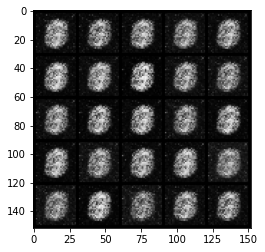

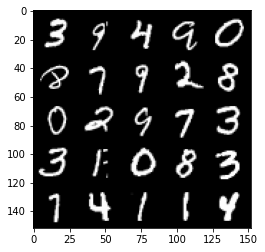

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000: Generator loss: 1.6244933269023887, discriminator loss: 0.29945731091499334


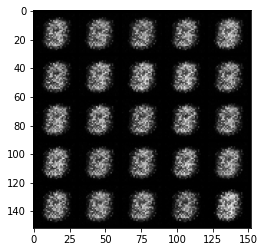

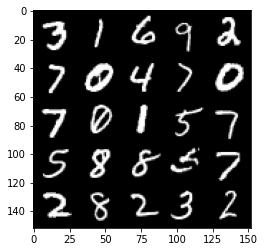

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500: Generator loss: 1.8397566461563117, discriminator loss: 0.18732161027193048


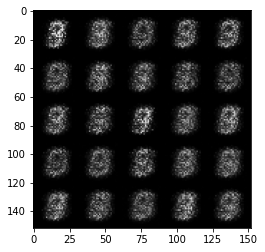

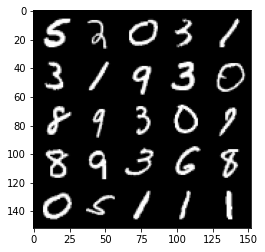

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2000: Generator loss: 1.6740693178176882, discriminator loss: 0.21095341131091117


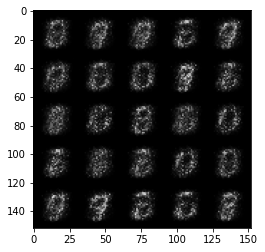

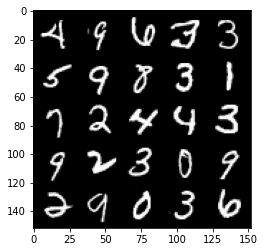

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2500: Generator loss: 1.7637823755741118, discriminator loss: 0.19011285722255708


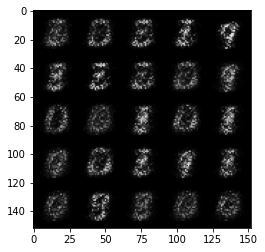

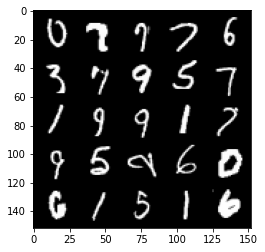

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000: Generator loss: 2.083706906557082, discriminator loss: 0.1436834947615862


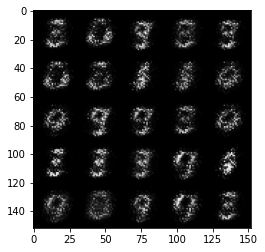

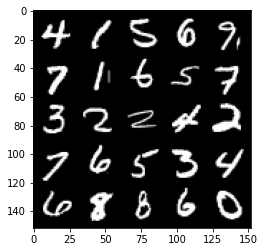

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3500: Generator loss: 2.565358773231503, discriminator loss: 0.10786324216425419


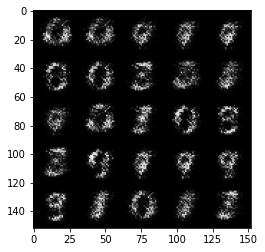

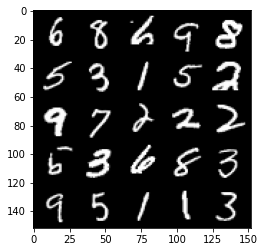

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4000: Generator loss: 2.9837836170196534, discriminator loss: 0.08642637735605249


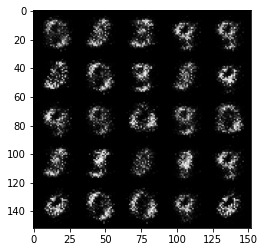

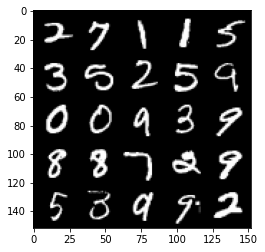

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4500: Generator loss: 3.336881254673002, discriminator loss: 0.07708513369411224


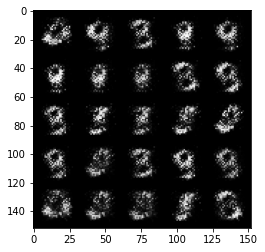

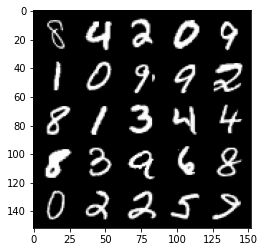

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5000: Generator loss: 3.7275241775512686, discriminator loss: 0.06476400090008981


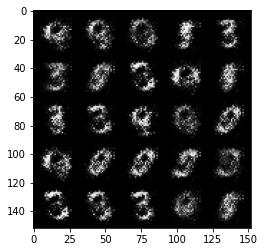

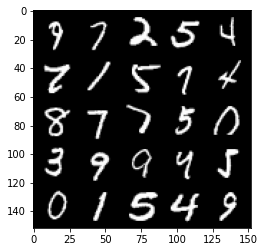

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5500: Generator loss: 4.0466230592727666, discriminator loss: 0.05424625419825312


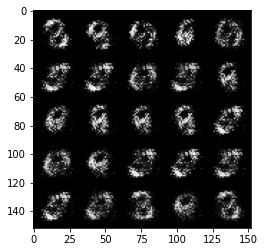

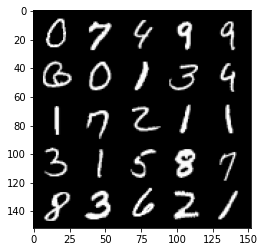

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6000: Generator loss: 4.0226604943275435, discriminator loss: 0.058057433005422376


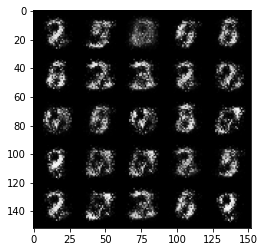

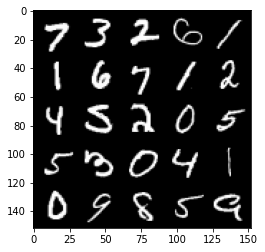

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6500: Generator loss: 4.114889235019686, discriminator loss: 0.058843702536076306


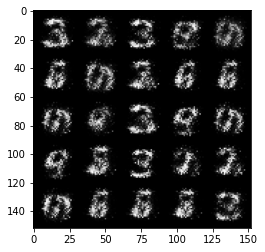

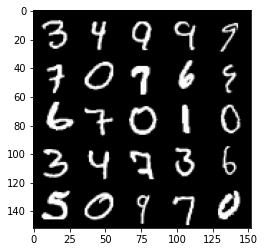

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7000: Generator loss: 4.36444062948227, discriminator loss: 0.050235732976347265


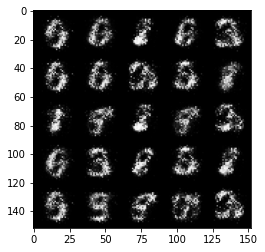

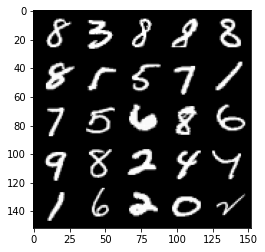

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7500: Generator loss: 4.269351972103119, discriminator loss: 0.047579705804586474


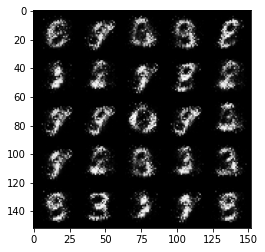

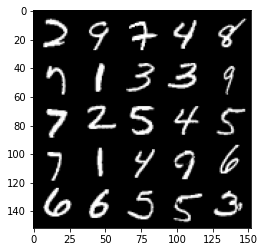

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8000: Generator loss: 4.126595668792724, discriminator loss: 0.05523275726288553


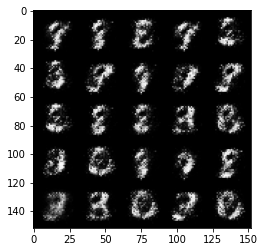

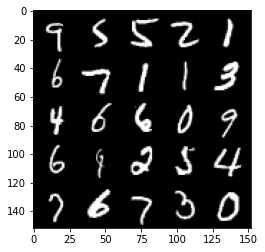

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8500: Generator loss: 4.094288528919223, discriminator loss: 0.06039245884865517


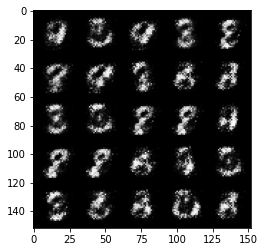

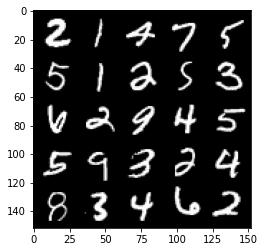

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000: Generator loss: 4.027168749809265, discriminator loss: 0.05712252316623929


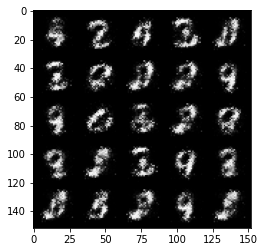

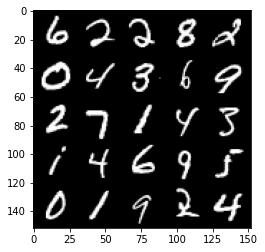

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9500: Generator loss: 4.246803556919091, discriminator loss: 0.054139619383960905


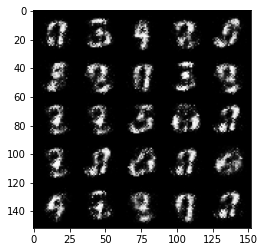

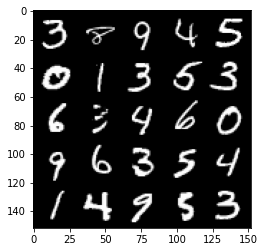

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10000: Generator loss: 4.2202981271743765, discriminator loss: 0.06266336448118091


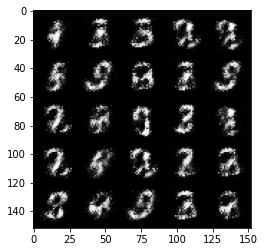

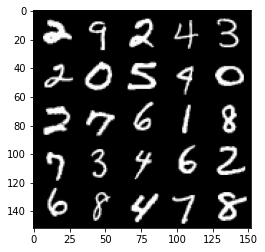

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10500: Generator loss: 4.106336338043212, discriminator loss: 0.06720233078300952


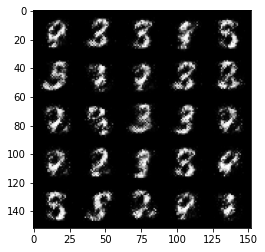

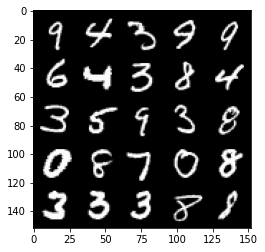

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11000: Generator loss: 4.053207440853122, discriminator loss: 0.07537385354936128


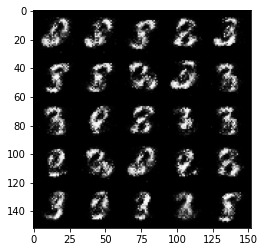

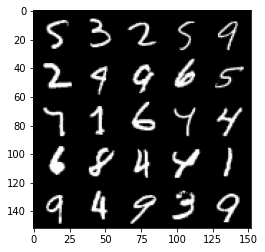

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11500: Generator loss: 4.094381921291348, discriminator loss: 0.07011685527116063


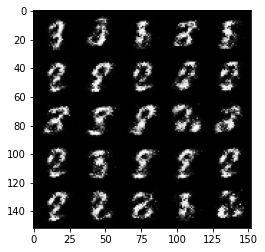

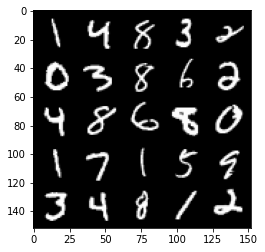

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000: Generator loss: 4.267986057758332, discriminator loss: 0.06872886215895416


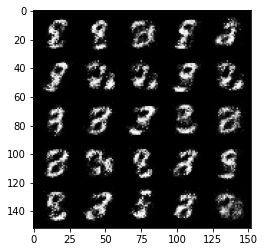

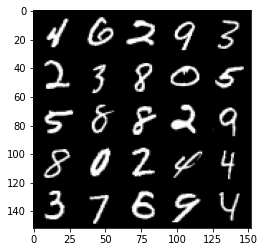

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12500: Generator loss: 4.008351999759679, discriminator loss: 0.0852328010797501


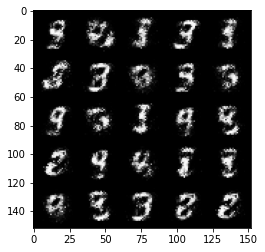

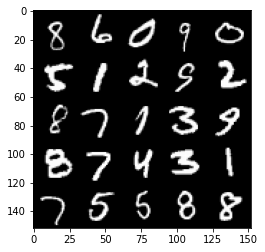

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13000: Generator loss: 3.9754329838752707, discriminator loss: 0.08643494980782272


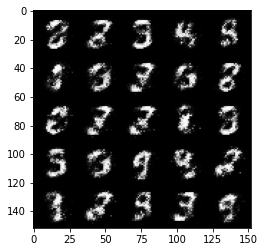

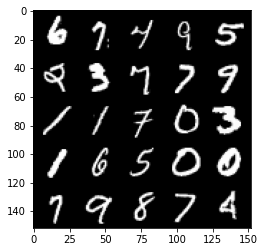

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13500: Generator loss: 3.9829281911849965, discriminator loss: 0.09593843349814427


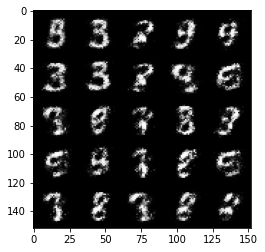

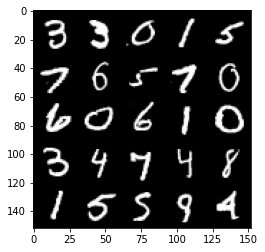

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14000: Generator loss: 3.7028861608505275, discriminator loss: 0.11353412679582837


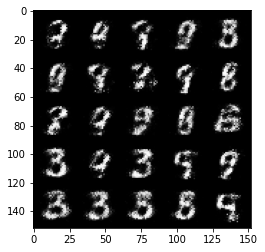

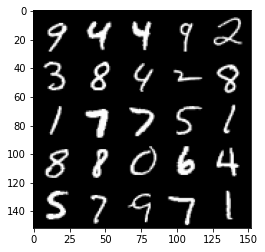

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14500: Generator loss: 3.525671390056612, discriminator loss: 0.1174630149900913


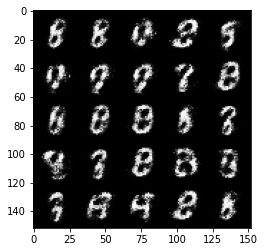

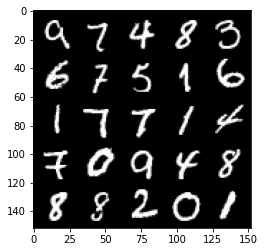

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15000: Generator loss: 3.556902858257294, discriminator loss: 0.11556320287287233


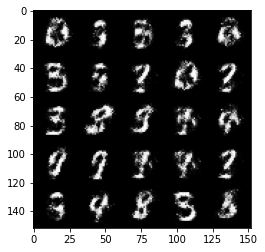

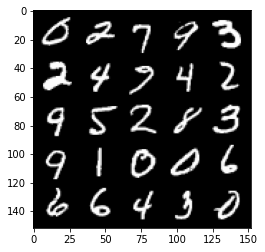

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15500: Generator loss: 3.443105787277225, discriminator loss: 0.12195637148618707


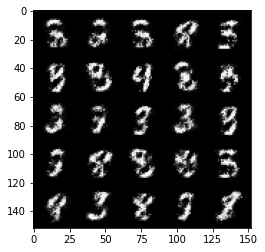

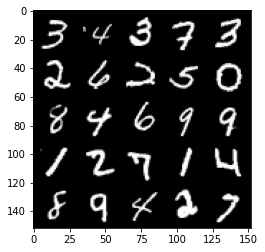

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16000: Generator loss: 3.37406942987442, discriminator loss: 0.1294172541350125


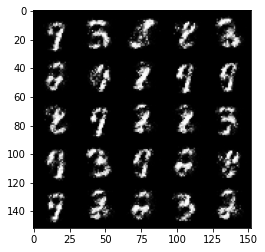

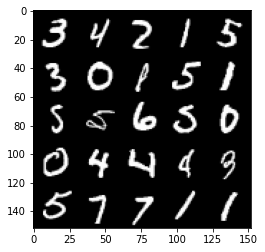

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16500: Generator loss: 3.408326490402223, discriminator loss: 0.11668727528303866


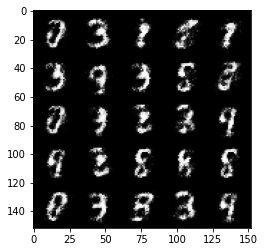

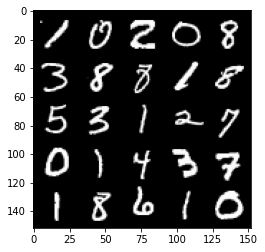

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17000: Generator loss: 3.4267234787940946, discriminator loss: 0.1130727348327638


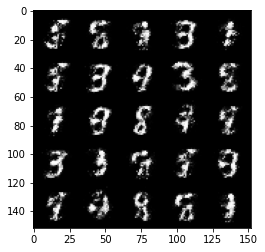

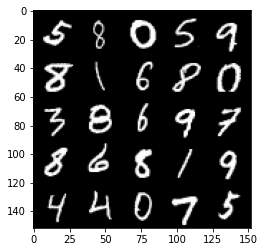

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17500: Generator loss: 3.3097805156707762, discriminator loss: 0.132823082216084


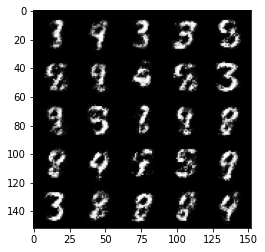

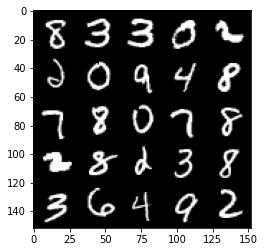

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18000: Generator loss: 3.2916042385101334, discriminator loss: 0.12257127511501315


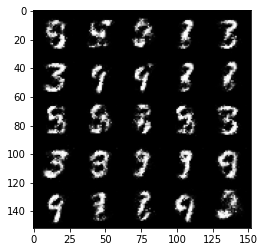

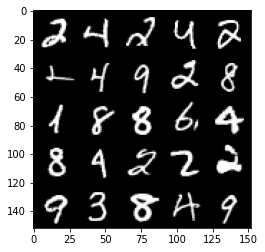

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18500: Generator loss: 3.3448065929412847, discriminator loss: 0.12557095874100915


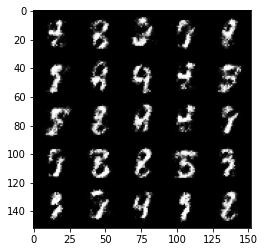

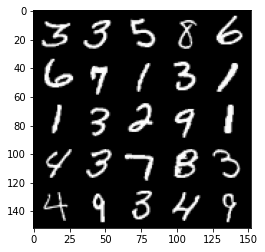

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19000: Generator loss: 3.320904110908509, discriminator loss: 0.131060469403863


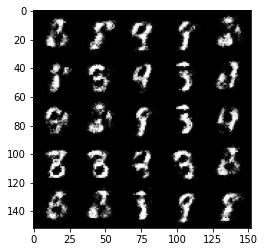

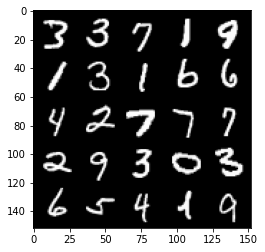

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19500: Generator loss: 3.2990689287185675, discriminator loss: 0.13838361681997777


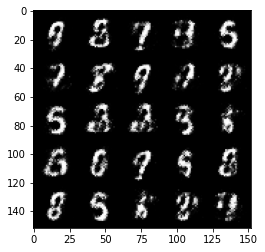

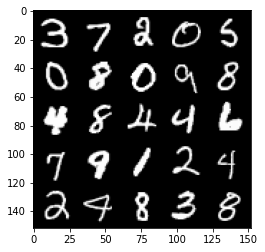

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20000: Generator loss: 3.3575655961036674, discriminator loss: 0.1489402648210526


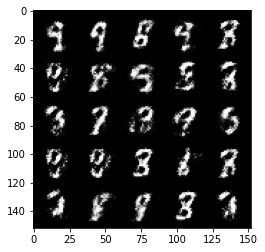

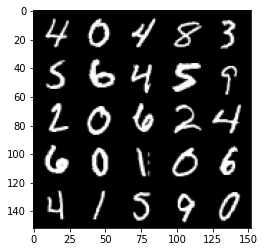

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20500: Generator loss: 3.22160853481293, discriminator loss: 0.15203354744613168


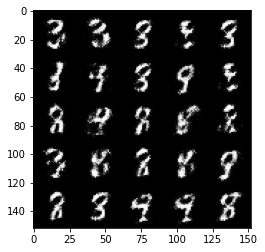

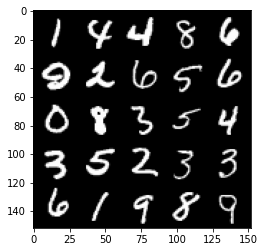

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21000: Generator loss: 3.34631642961502, discriminator loss: 0.1489114260971547


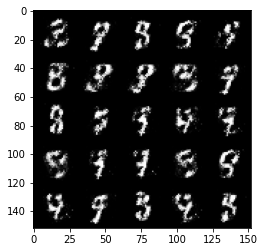

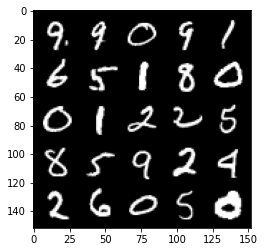

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21500: Generator loss: 3.3690715017318733, discriminator loss: 0.13799021144211301


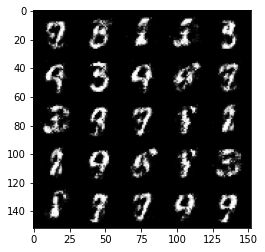

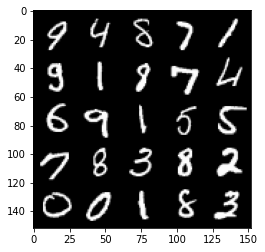

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22000: Generator loss: 3.015862465381622, discriminator loss: 0.18344227437675


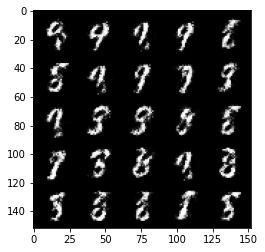

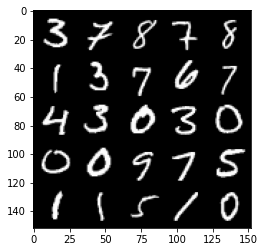

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22500: Generator loss: 2.933292384147645, discriminator loss: 0.19803661160171054


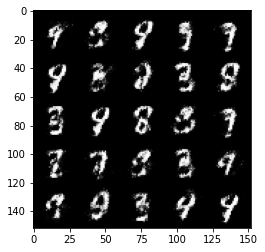

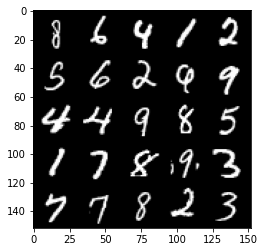

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23000: Generator loss: 2.9830390458106986, discriminator loss: 0.164765026986599


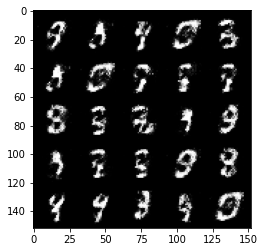

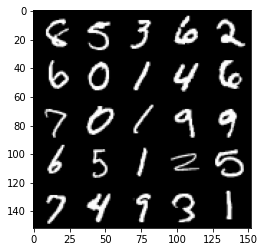

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23500: Generator loss: 3.1171126732826258, discriminator loss: 0.16687787453830244


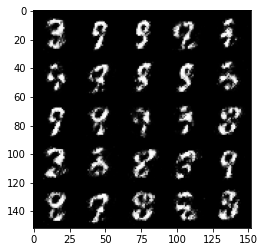

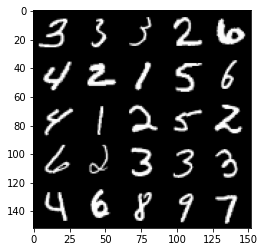

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24000: Generator loss: 2.9278815083503753, discriminator loss: 0.19255210445821277


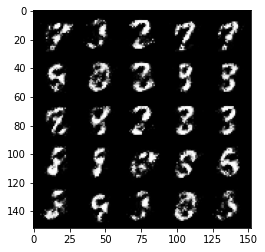

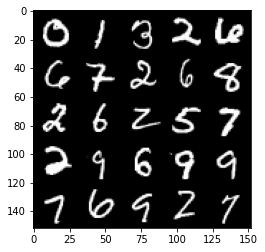

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24500: Generator loss: 2.855818734169007, discriminator loss: 0.19010766077041635


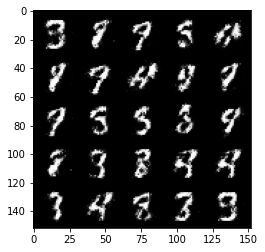

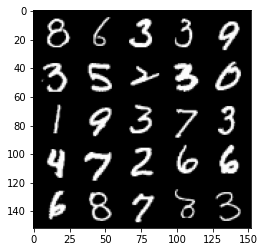

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25000: Generator loss: 2.8211517405509956, discriminator loss: 0.1987653356641531


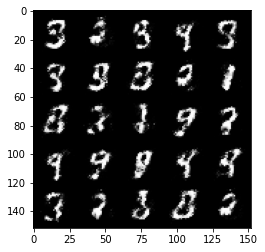

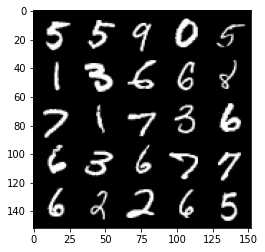

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25500: Generator loss: 2.839133787155153, discriminator loss: 0.1872353742420674


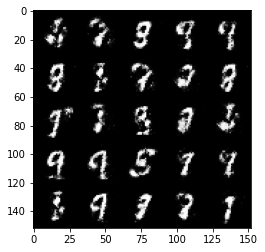

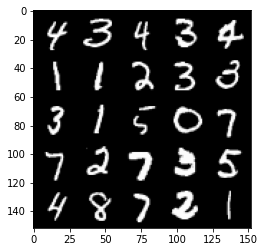

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26000: Generator loss: 2.771004112720491, discriminator loss: 0.19505018818378458


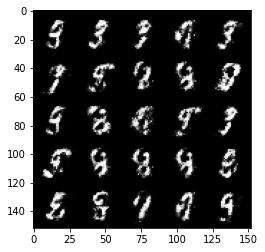

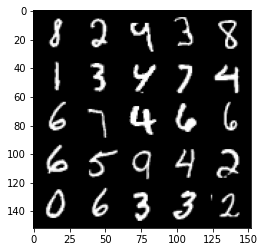

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26500: Generator loss: 2.751201008796694, discriminator loss: 0.1976769502013923


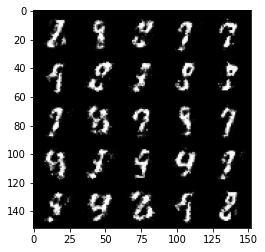

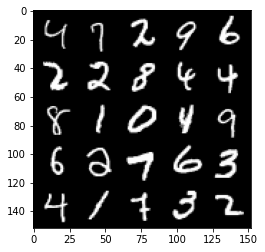

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27000: Generator loss: 2.859775109291079, discriminator loss: 0.19264766627550128


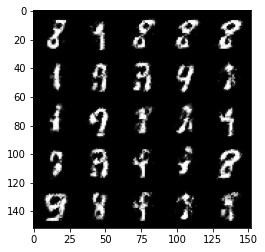

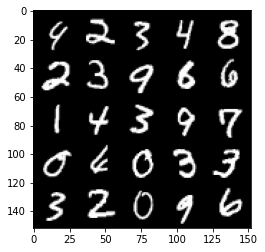

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27500: Generator loss: 2.615357386112213, discriminator loss: 0.21679727667570128


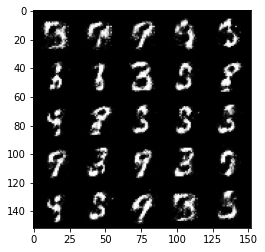

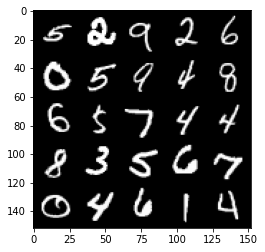

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28000: Generator loss: 2.73658352851868, discriminator loss: 0.20297182813286763


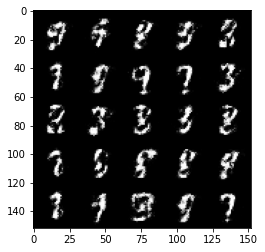

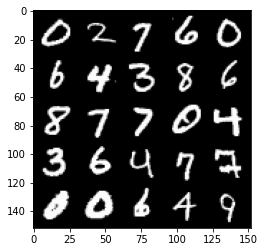

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28500: Generator loss: 2.6770538706779474, discriminator loss: 0.22066358526051047


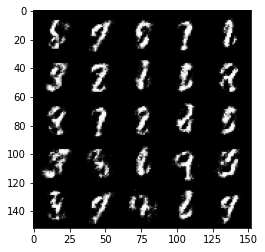

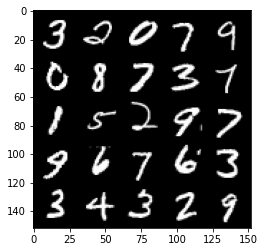

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29000: Generator loss: 2.4575910499095914, discriminator loss: 0.26248538601398486


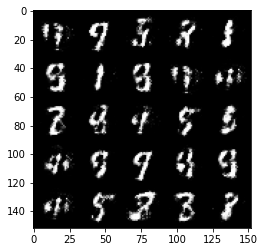

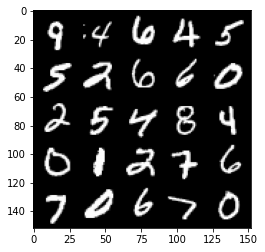

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29500: Generator loss: 2.6673994073867804, discriminator loss: 0.21700404667854298


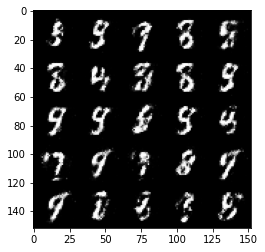

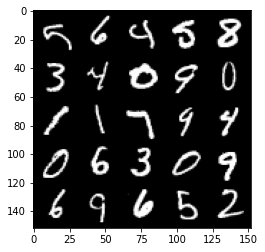

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30000: Generator loss: 2.6065695886611917, discriminator loss: 0.22992112112045304


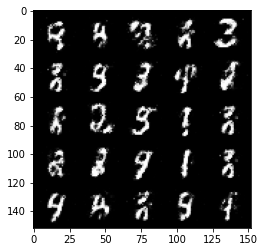

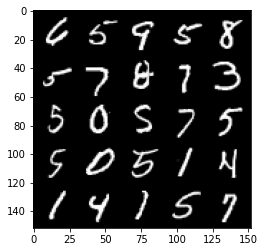

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30500: Generator loss: 2.5427290639877316, discriminator loss: 0.2383015717267991


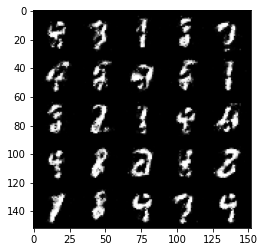

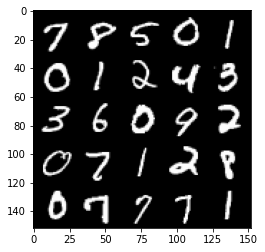

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31000: Generator loss: 2.5644420862197856, discriminator loss: 0.22493055954575553


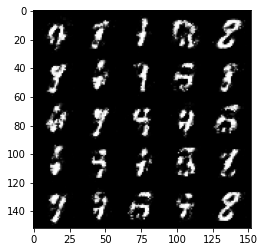

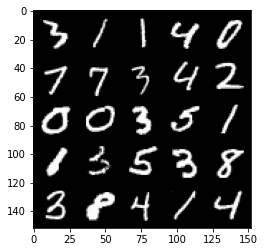

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31500: Generator loss: 2.6657399492263805, discriminator loss: 0.21901472502946848


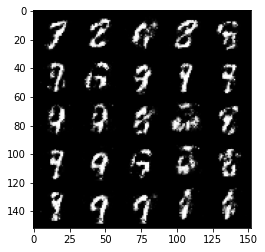

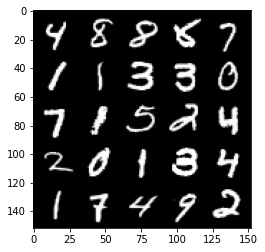

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32000: Generator loss: 2.512976459980013, discriminator loss: 0.2587794927656651


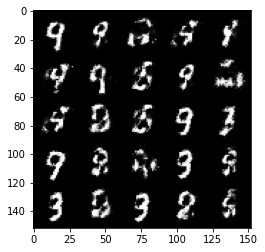

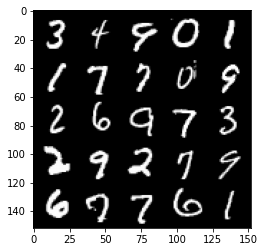

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32500: Generator loss: 2.415302819490432, discriminator loss: 0.25977026158571237


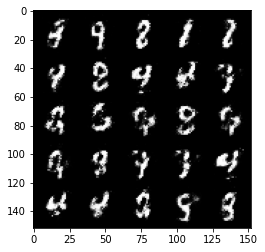

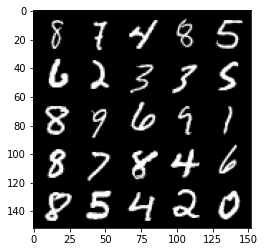

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33000: Generator loss: 2.358826185226441, discriminator loss: 0.2698837231993677


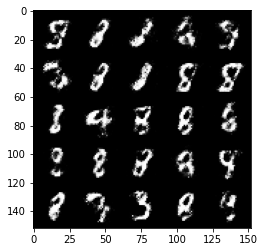

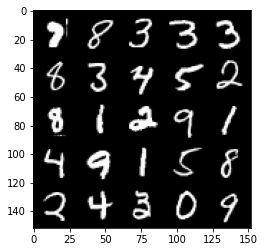

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33500: Generator loss: 2.315039007425309, discriminator loss: 0.2624011255800722


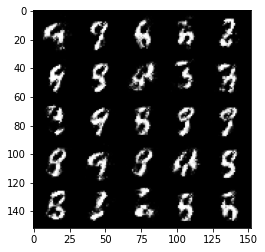

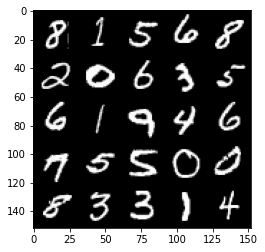

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34000: Generator loss: 2.3718789982795703, discriminator loss: 0.24634025579690932


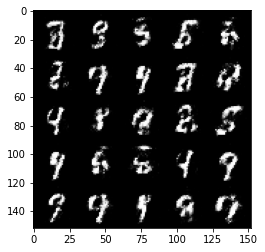

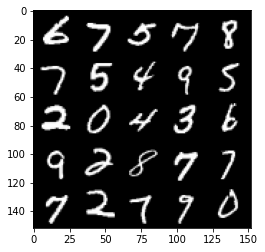

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34500: Generator loss: 2.296680117130281, discriminator loss: 0.2701013064980508


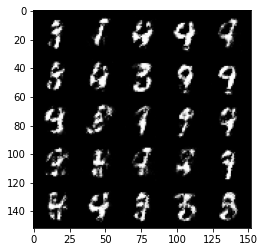

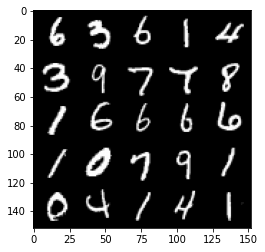

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35000: Generator loss: 2.2001620347499857, discriminator loss: 0.27322907468676566


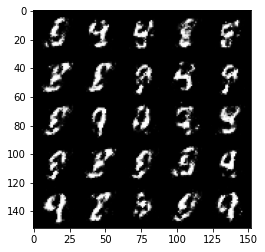

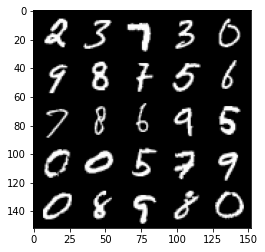

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35500: Generator loss: 2.299063654899597, discriminator loss: 0.2643626303672791


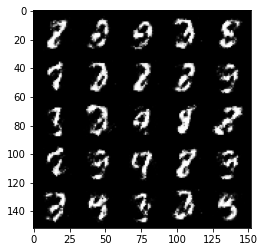

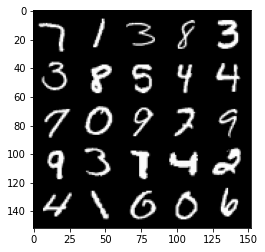

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36000: Generator loss: 2.241734522819517, discriminator loss: 0.264584333062172


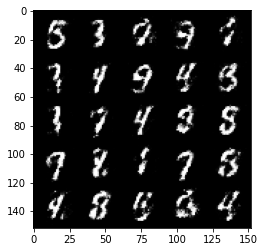

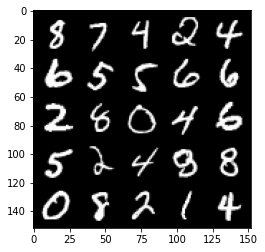

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36500: Generator loss: 2.147738030910494, discriminator loss: 0.28840948411822304


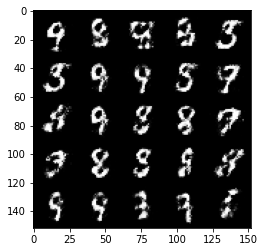

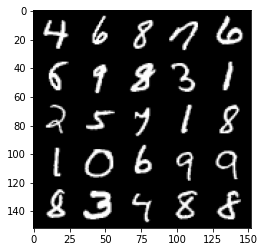

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37000: Generator loss: 2.188580412387847, discriminator loss: 0.27841816285252596


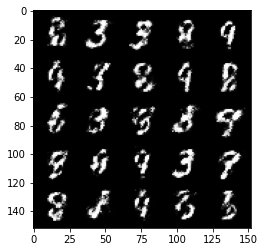

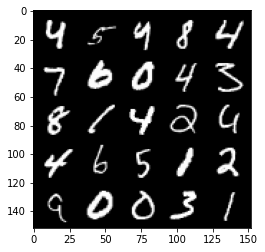

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37500: Generator loss: 2.143228528499604, discriminator loss: 0.29078417450189564


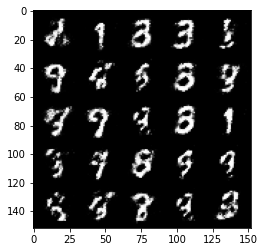

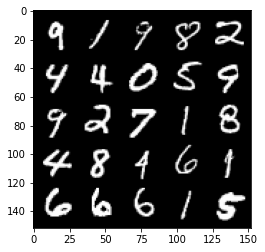

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38000: Generator loss: 2.0515336833000184, discriminator loss: 0.30629580733180034


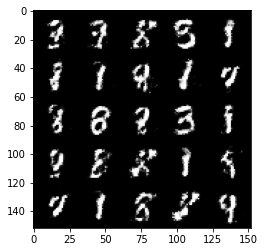

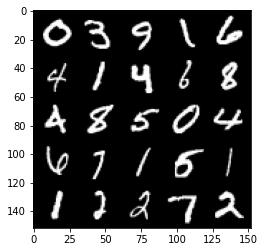

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38500: Generator loss: 2.1511916356086718, discriminator loss: 0.28419682109355904


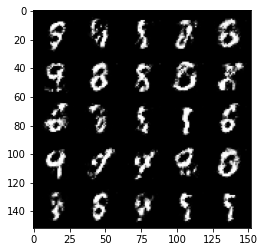

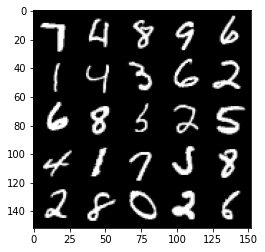

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39000: Generator loss: 2.2037183551788337, discriminator loss: 0.2746680958569051


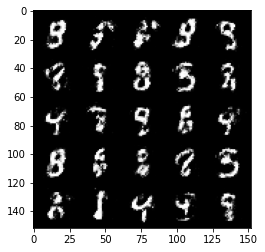

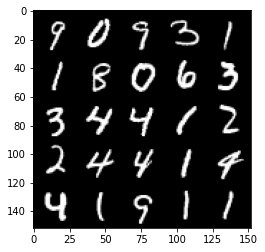

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39500: Generator loss: 2.1934668161869046, discriminator loss: 0.29290186733007384


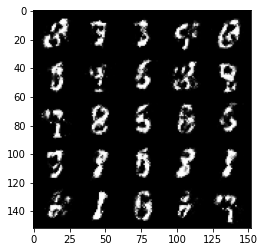

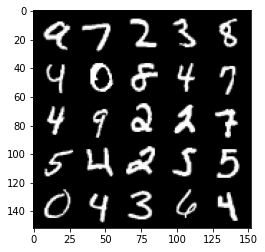

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40000: Generator loss: 2.1397748181819924, discriminator loss: 0.2856549347639082


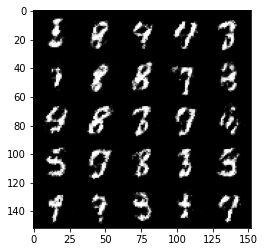

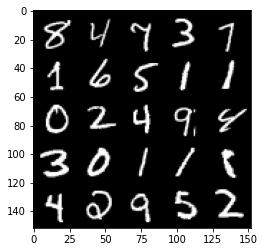

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40500: Generator loss: 2.0582488663196563, discriminator loss: 0.31312036705017104


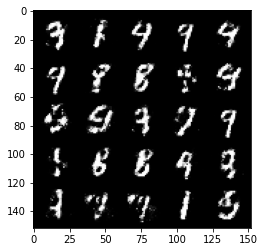

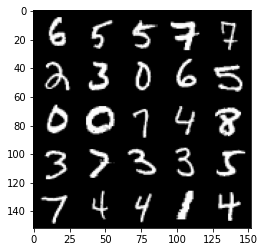

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41000: Generator loss: 1.994650341033937, discriminator loss: 0.3222394094169139


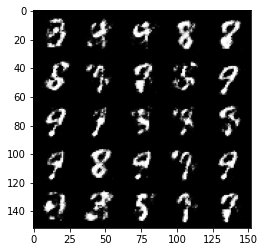

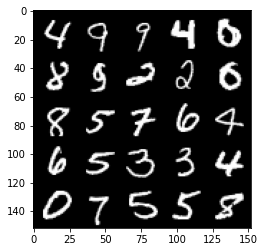

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41500: Generator loss: 1.987132465600969, discriminator loss: 0.31921637043356915


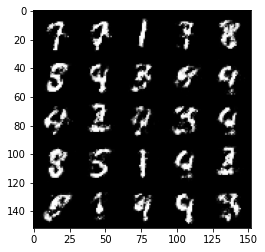

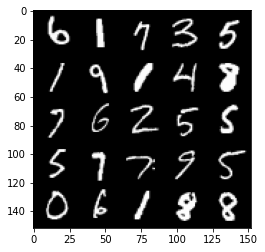

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42000: Generator loss: 1.9818537573814408, discriminator loss: 0.3191810185611246


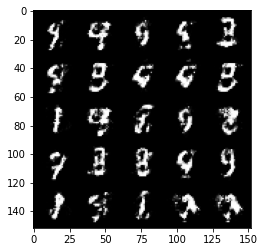

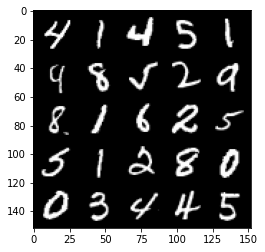

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42500: Generator loss: 2.0076077678203577, discriminator loss: 0.31616867667436616


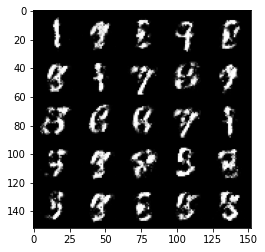

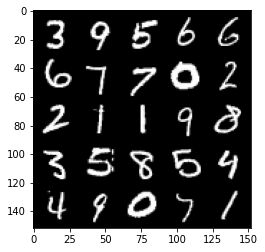

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43000: Generator loss: 2.054724761009216, discriminator loss: 0.300554587870836


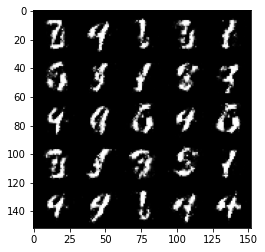

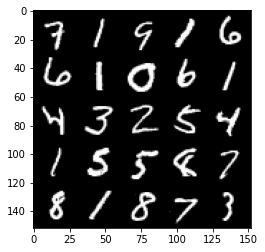

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43500: Generator loss: 2.1602975676059724, discriminator loss: 0.2890451204776768


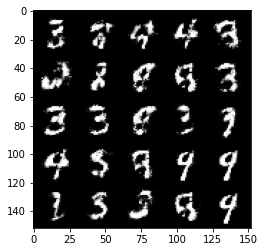

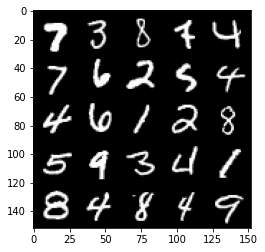

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44000: Generator loss: 2.1825760378837575, discriminator loss: 0.2802203603088856


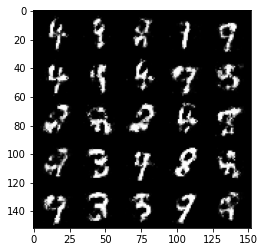

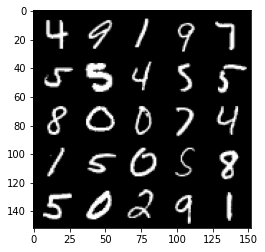

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44500: Generator loss: 2.14746492767334, discriminator loss: 0.2830849727988245


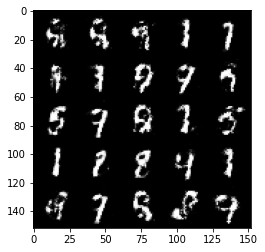

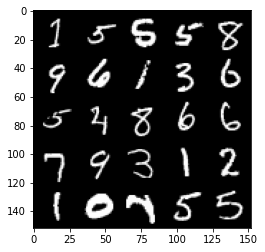

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45000: Generator loss: 2.034046048641201, discriminator loss: 0.3062286607921123


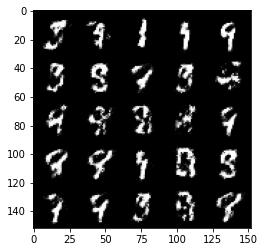

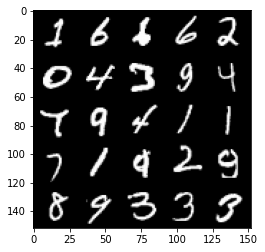

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45500: Generator loss: 2.0512778162956247, discriminator loss: 0.3090067467093469


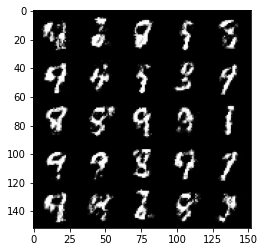

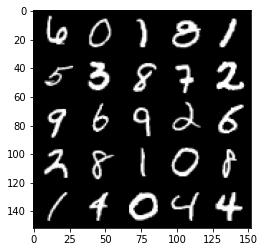

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46000: Generator loss: 1.9795134389400475, discriminator loss: 0.3121092956364155


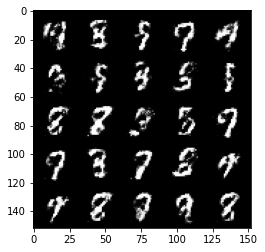

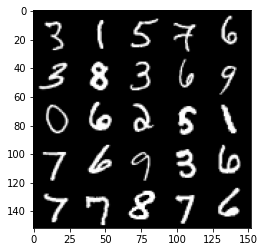

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46500: Generator loss: 1.9873975176811207, discriminator loss: 0.3199845447540281


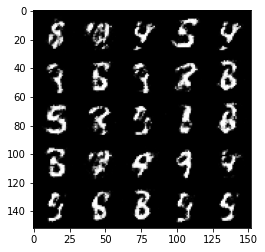

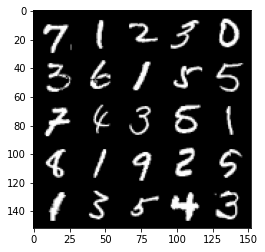

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47000: Generator loss: 1.8402187707424167, discriminator loss: 0.34734428393840827


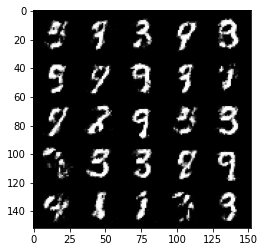

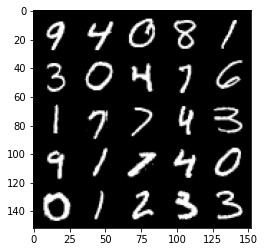

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47500: Generator loss: 1.9271834061145774, discriminator loss: 0.32969565728306793


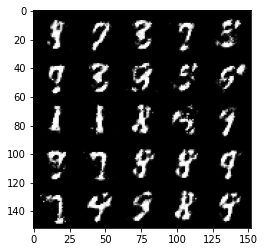

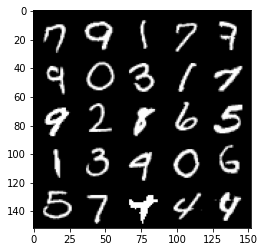

  0%|          | 0/469 [00:00<?, ?it/s]

Step 48000: Generator loss: 1.9128135447502128, discriminator loss: 0.33457706710696233


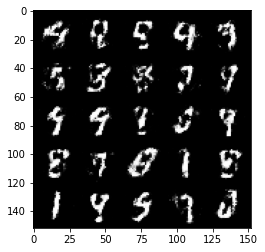

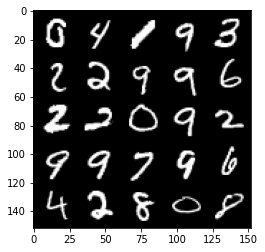

  0%|          | 0/469 [00:00<?, ?it/s]

Step 48500: Generator loss: 1.8228708162307725, discriminator loss: 0.34075985193252595


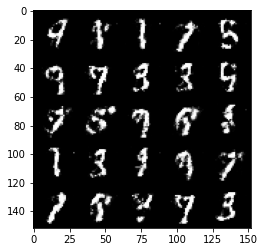

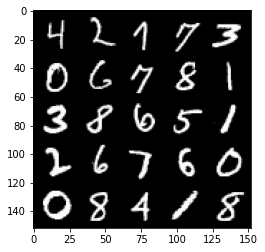

  0%|          | 0/469 [00:00<?, ?it/s]

Step 49000: Generator loss: 1.7948574259281158, discriminator loss: 0.3579622491002082


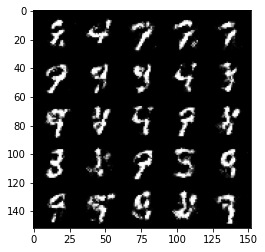

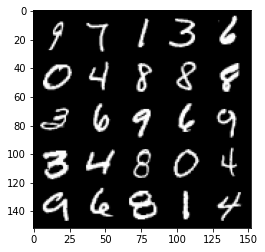

  0%|          | 0/469 [00:00<?, ?it/s]

Step 49500: Generator loss: 1.8592316188812275, discriminator loss: 0.3305293792784214


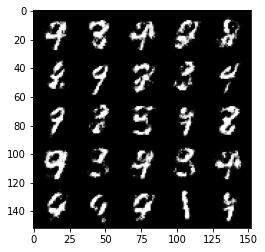

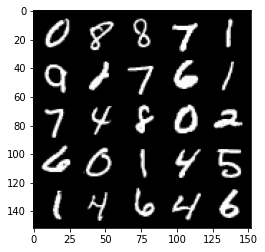

  0%|          | 0/469 [00:00<?, ?it/s]

Step 50000: Generator loss: 1.8773334128856671, discriminator loss: 0.33613886737823523


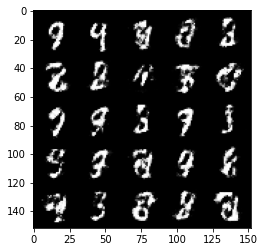

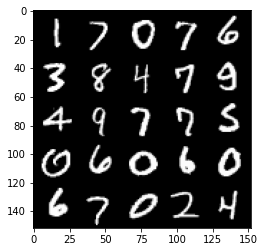

  0%|          | 0/469 [00:00<?, ?it/s]

Step 50500: Generator loss: 1.7573103482723227, discriminator loss: 0.3518000210821627


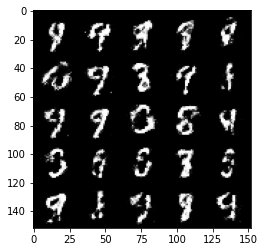

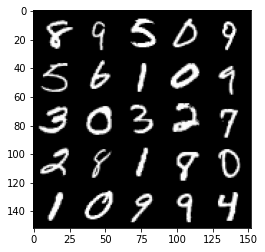

  0%|          | 0/469 [00:00<?, ?it/s]

Step 51000: Generator loss: 1.7626353998184212, discriminator loss: 0.3524959169626236


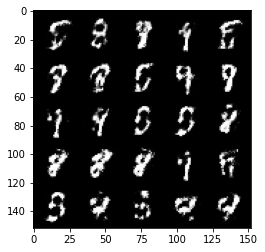

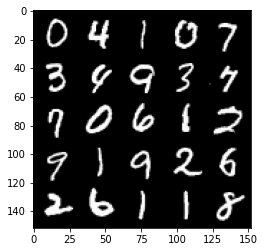

  0%|          | 0/469 [00:00<?, ?it/s]

Step 51500: Generator loss: 1.7561983473300933, discriminator loss: 0.35874680531024944


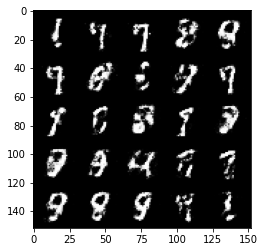

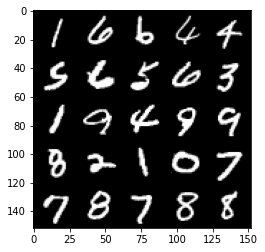

  0%|          | 0/469 [00:00<?, ?it/s]

Step 52000: Generator loss: 1.7188800222873697, discriminator loss: 0.3627777064442633


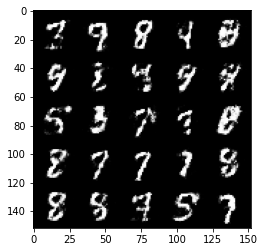

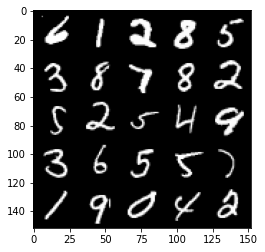

  0%|          | 0/469 [00:00<?, ?it/s]

Step 52500: Generator loss: 1.7644709899425497, discriminator loss: 0.34918175822496406


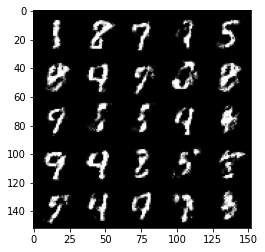

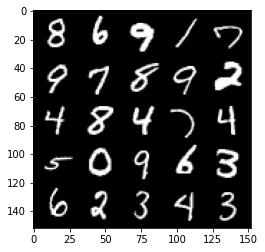

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 53000: Generator loss: 1.76723379158974, discriminator loss: 0.3549459447562692


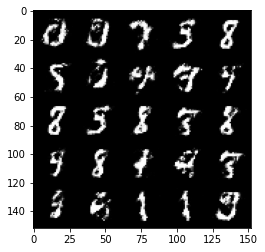

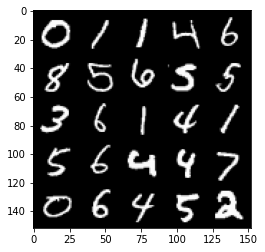

  0%|          | 0/469 [00:00<?, ?it/s]

Step 53500: Generator loss: 1.850249408483505, discriminator loss: 0.33852768251299864


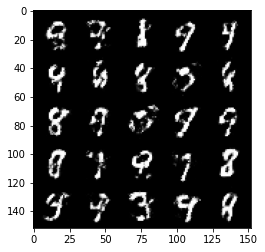

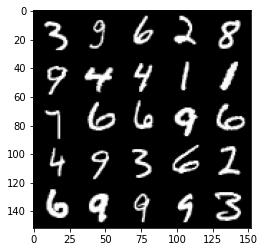

  0%|          | 0/469 [00:00<?, ?it/s]

Step 54000: Generator loss: 1.7579142017364502, discriminator loss: 0.3602842841148373


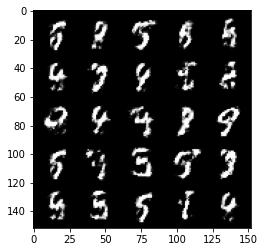

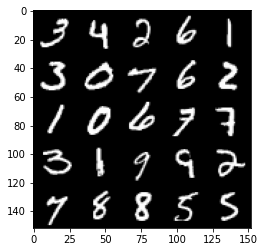

  0%|          | 0/469 [00:00<?, ?it/s]

Step 54500: Generator loss: 1.7748137798309302, discriminator loss: 0.35789301627874415


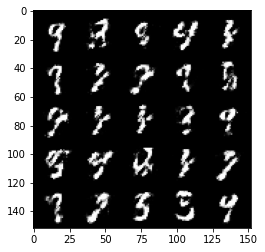

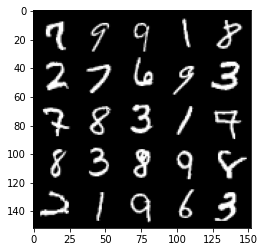

  0%|          | 0/469 [00:00<?, ?it/s]

Step 55000: Generator loss: 1.7897343208789813, discriminator loss: 0.3477908111512668


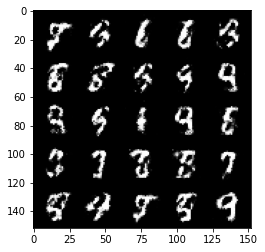

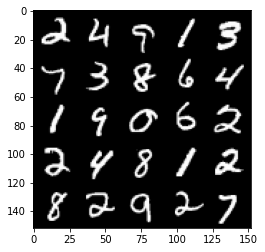

  0%|          | 0/469 [00:00<?, ?it/s]

Step 55500: Generator loss: 1.752173960685728, discriminator loss: 0.35597145372629174


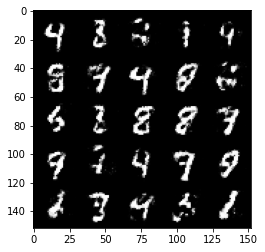

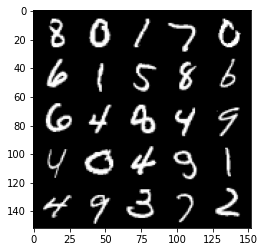

  0%|          | 0/469 [00:00<?, ?it/s]

Step 56000: Generator loss: 1.7819169456958783, discriminator loss: 0.34224260604381535


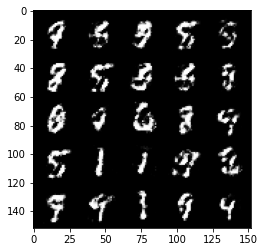

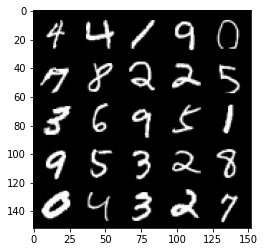

  0%|          | 0/469 [00:00<?, ?it/s]

Step 56500: Generator loss: 1.6920667455196374, discriminator loss: 0.36685098314285247


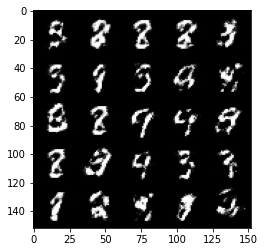

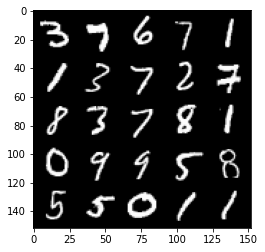

  0%|          | 0/469 [00:00<?, ?it/s]

Step 57000: Generator loss: 1.5714191579818715, discriminator loss: 0.39976141023635897


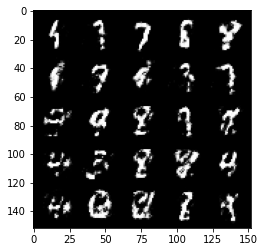

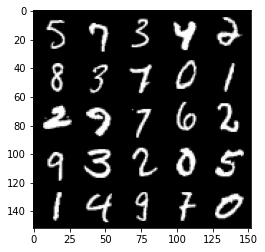

  0%|          | 0/469 [00:00<?, ?it/s]

Step 57500: Generator loss: 1.7043624207973487, discriminator loss: 0.3663589897751812


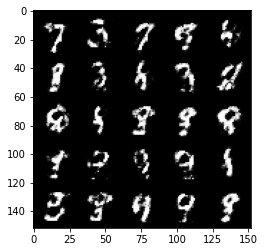

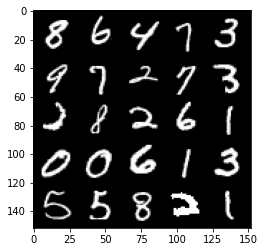

  0%|          | 0/469 [00:00<?, ?it/s]

Step 58000: Generator loss: 1.6334040734767916, discriminator loss: 0.39174162715673444


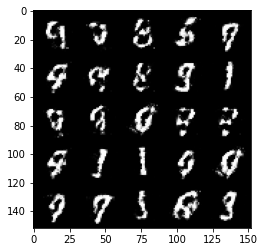

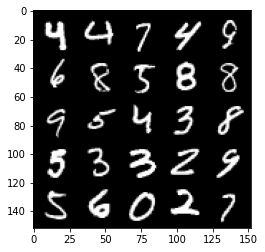

  0%|          | 0/469 [00:00<?, ?it/s]

Step 58500: Generator loss: 1.6952970976829527, discriminator loss: 0.3676728550791742


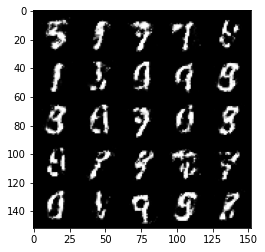

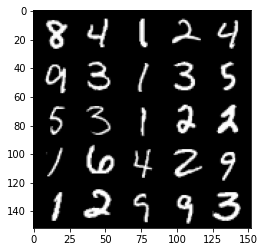

  0%|          | 0/469 [00:00<?, ?it/s]

Step 59000: Generator loss: 1.7124908609390253, discriminator loss: 0.36997336852550505


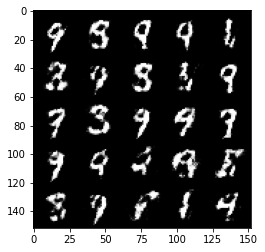

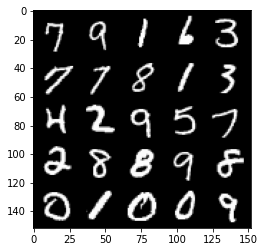

  0%|          | 0/469 [00:00<?, ?it/s]

Step 59500: Generator loss: 1.7083605782985687, discriminator loss: 0.3573489096164705


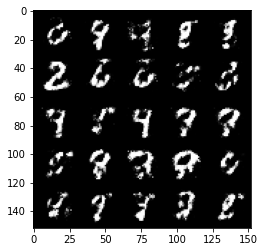

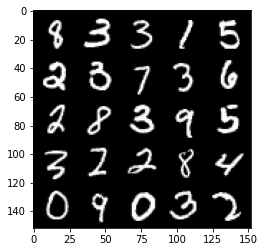

  0%|          | 0/469 [00:00<?, ?it/s]

Step 60000: Generator loss: 1.706519478082657, discriminator loss: 0.3789400292038918


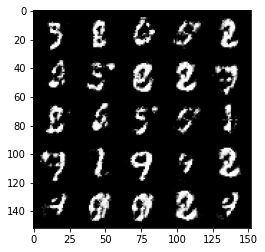

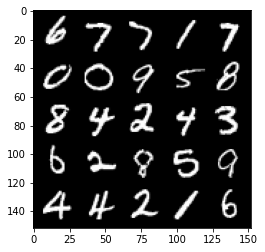

  0%|          | 0/469 [00:00<?, ?it/s]

Step 60500: Generator loss: 1.7623638880252845, discriminator loss: 0.3575706276893616


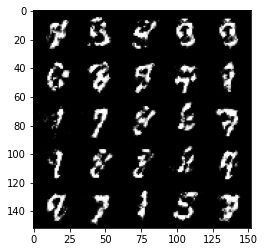

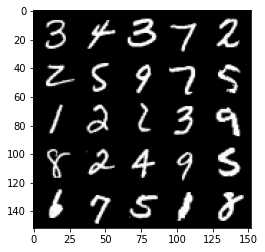

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 61000: Generator loss: 1.7165841279029852, discriminator loss: 0.37343146222829854


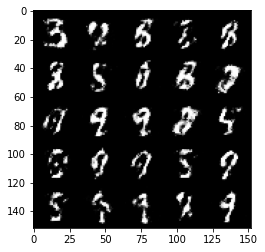

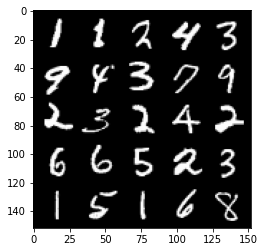

  0%|          | 0/469 [00:00<?, ?it/s]

Step 61500: Generator loss: 1.5727355666160583, discriminator loss: 0.39562106817960735


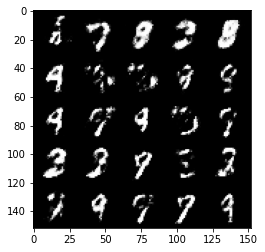

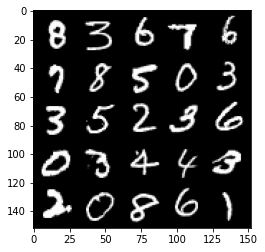

  0%|          | 0/469 [00:00<?, ?it/s]

Step 62000: Generator loss: 1.6369315981864954, discriminator loss: 0.3750918483138084


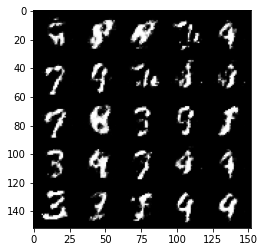

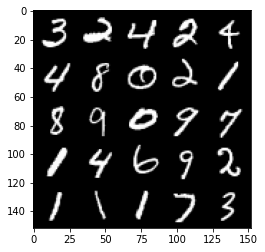

  0%|          | 0/469 [00:00<?, ?it/s]

Step 62500: Generator loss: 1.7510831556320183, discriminator loss: 0.34423487663269053


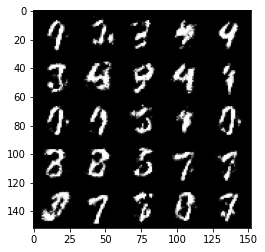

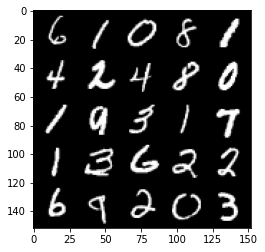

  0%|          | 0/469 [00:00<?, ?it/s]

Step 63000: Generator loss: 1.7787155888080586, discriminator loss: 0.3586352627873422


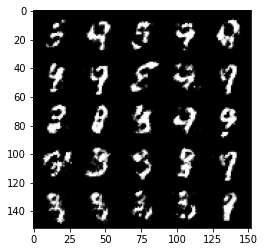

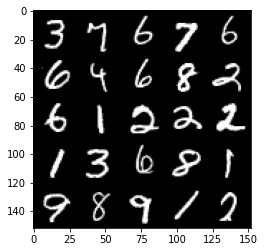

  0%|          | 0/469 [00:00<?, ?it/s]

Step 63500: Generator loss: 1.6522876243591291, discriminator loss: 0.38251594132185013


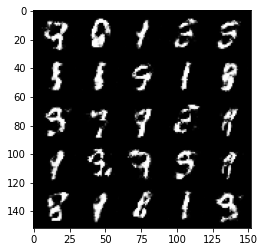

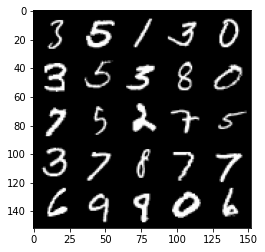

  0%|          | 0/469 [00:00<?, ?it/s]

Step 64000: Generator loss: 1.7715946147441861, discriminator loss: 0.3517629013657566


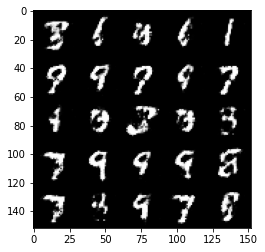

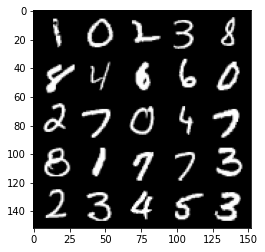

  0%|          | 0/469 [00:00<?, ?it/s]

Step 64500: Generator loss: 1.6396123893260959, discriminator loss: 0.385739400446415


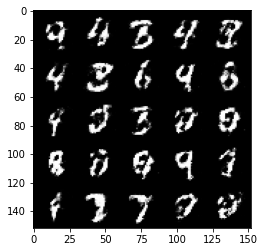

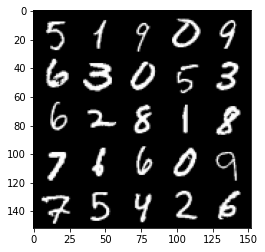

  0%|          | 0/469 [00:00<?, ?it/s]

Step 65000: Generator loss: 1.5806708731651307, discriminator loss: 0.40029958081245415


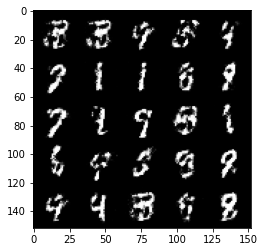

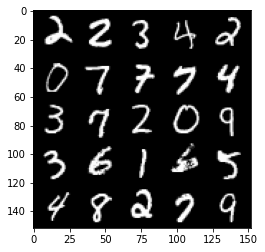

  0%|          | 0/469 [00:00<?, ?it/s]

Step 65500: Generator loss: 1.6366835494041458, discriminator loss: 0.3858178763985633


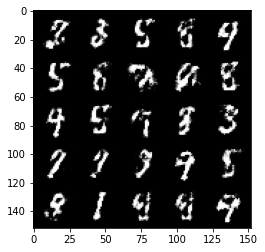

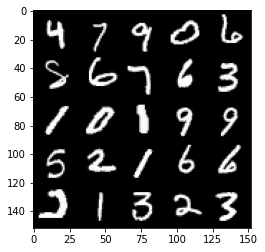

  0%|          | 0/469 [00:00<?, ?it/s]

Step 66000: Generator loss: 1.5791841948032384, discriminator loss: 0.4055778566598892


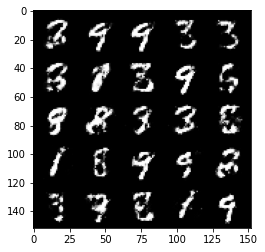

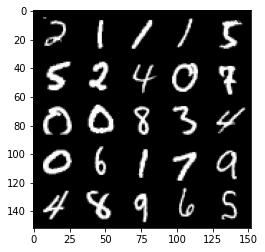

  0%|          | 0/469 [00:00<?, ?it/s]

Step 66500: Generator loss: 1.5974417769908904, discriminator loss: 0.3991820523738861


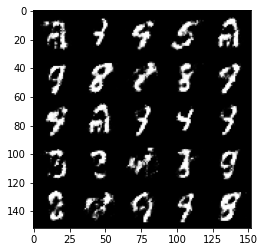

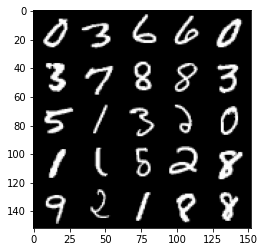

  0%|          | 0/469 [00:00<?, ?it/s]

Step 67000: Generator loss: 1.5554670674800883, discriminator loss: 0.4074418668150904


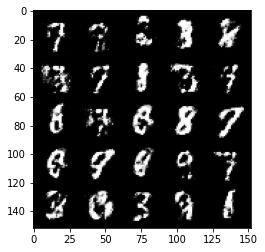

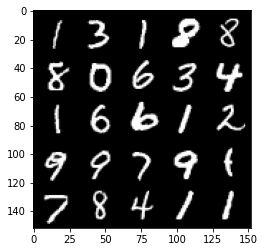

  0%|          | 0/469 [00:00<?, ?it/s]

Step 67500: Generator loss: 1.4714164080619814, discriminator loss: 0.41451454991102155


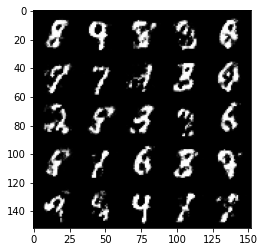

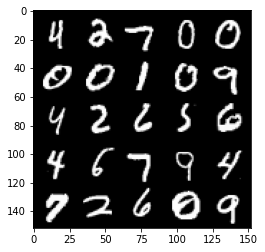

  0%|          | 0/469 [00:00<?, ?it/s]

Step 68000: Generator loss: 1.5172945978641514, discriminator loss: 0.41835157191753386


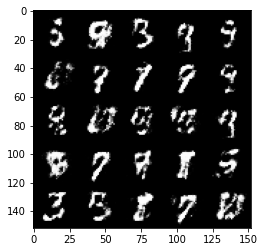

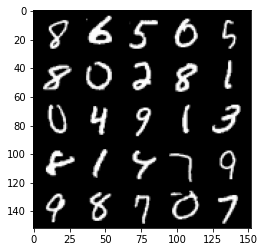

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 68500: Generator loss: 1.4342776129245751, discriminator loss: 0.4369752975106238


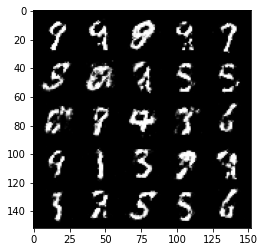

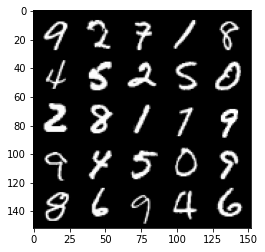

  0%|          | 0/469 [00:00<?, ?it/s]

Step 69000: Generator loss: 1.4515605535507212, discriminator loss: 0.434375514149666


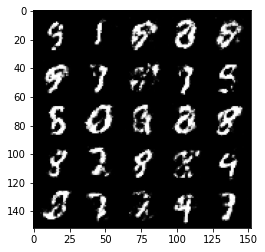

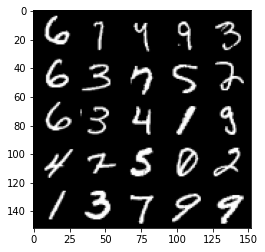

  0%|          | 0/469 [00:00<?, ?it/s]

Step 69500: Generator loss: 1.4788273506164542, discriminator loss: 0.422805564880371


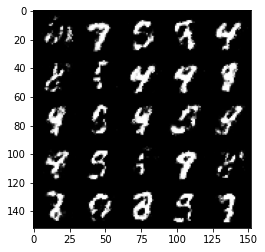

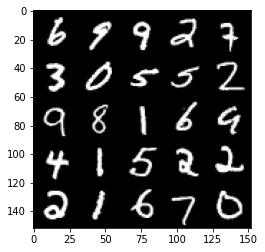

  0%|          | 0/469 [00:00<?, ?it/s]

Step 70000: Generator loss: 1.38970972967148, discriminator loss: 0.4459319835305208


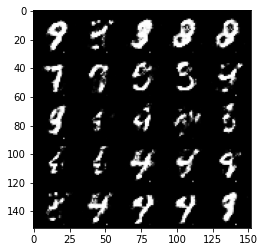

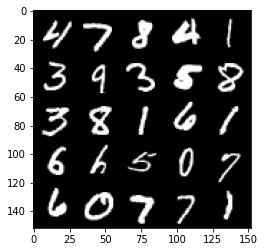

  0%|          | 0/469 [00:00<?, ?it/s]

Step 70500: Generator loss: 1.5165712773799893, discriminator loss: 0.4015891242027288


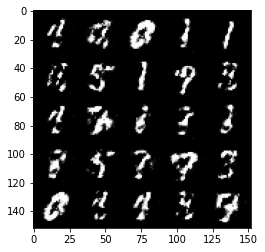

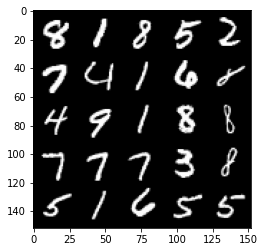

  0%|          | 0/469 [00:00<?, ?it/s]

Step 71000: Generator loss: 1.5465622246265422, discriminator loss: 0.4004078933000564


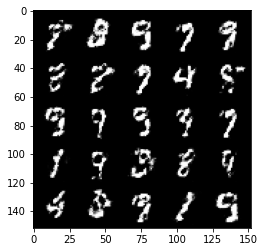

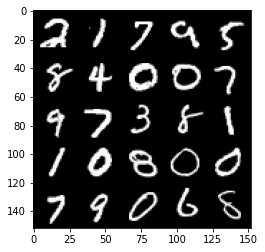

  0%|          | 0/469 [00:00<?, ?it/s]

Step 71500: Generator loss: 1.4907688808441166, discriminator loss: 0.4186922512650486


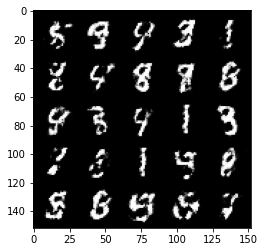

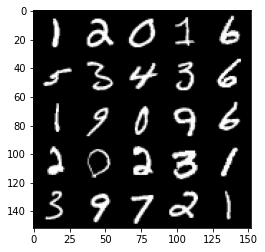

  0%|          | 0/469 [00:00<?, ?it/s]

Step 72000: Generator loss: 1.5260008888244625, discriminator loss: 0.4156571266651151


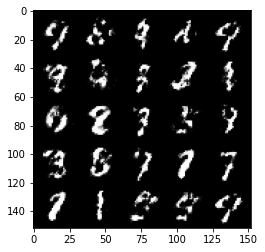

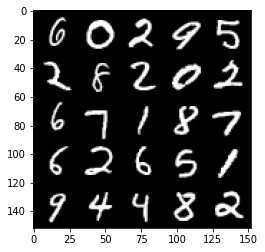

  0%|          | 0/469 [00:00<?, ?it/s]

Step 72500: Generator loss: 1.4250678796768192, discriminator loss: 0.43141440612077725


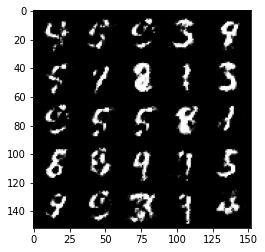

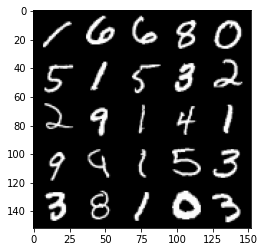

  0%|          | 0/469 [00:00<?, ?it/s]

Step 73000: Generator loss: 1.4582796638011928, discriminator loss: 0.4222783200144772


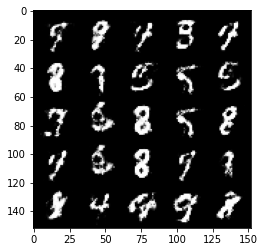

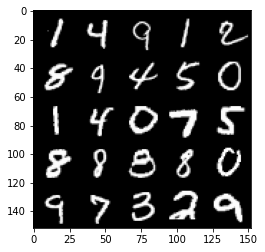

  0%|          | 0/469 [00:00<?, ?it/s]

Step 73500: Generator loss: 1.4819130816459636, discriminator loss: 0.41123622107505753


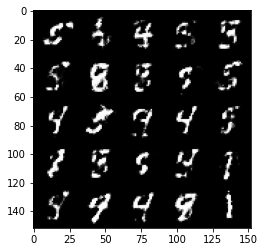

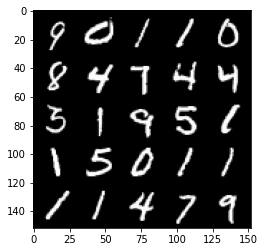

  0%|          | 0/469 [00:00<?, ?it/s]

Step 74000: Generator loss: 1.4549017477035524, discriminator loss: 0.4184931330680846


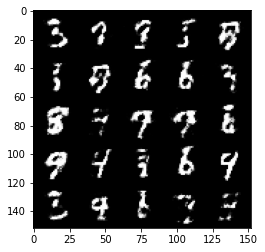

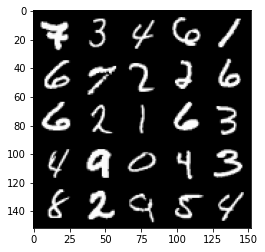

  0%|          | 0/469 [00:00<?, ?it/s]

Step 74500: Generator loss: 1.4361053006649005, discriminator loss: 0.43361762207746496


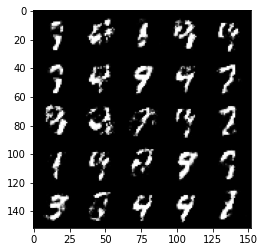

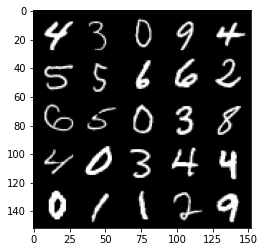

  0%|          | 0/469 [00:00<?, ?it/s]

Step 75000: Generator loss: 1.4502876601219186, discriminator loss: 0.43020779877901094


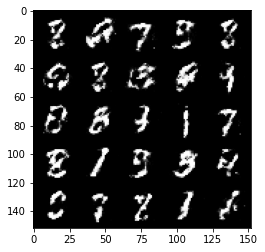

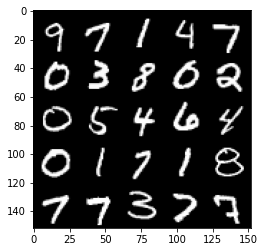

  0%|          | 0/469 [00:00<?, ?it/s]

Step 75500: Generator loss: 1.4559382085800168, discriminator loss: 0.4319065988659857


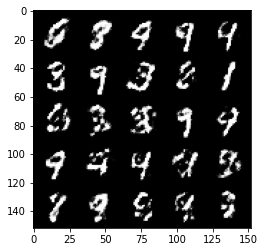

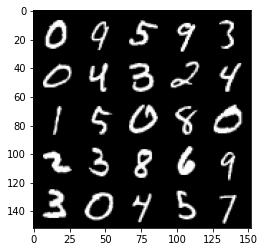

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 76000: Generator loss: 1.4077776417732255, discriminator loss: 0.43754776853322974


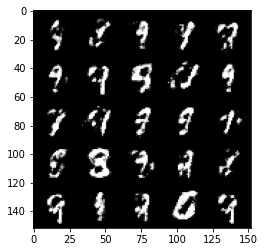

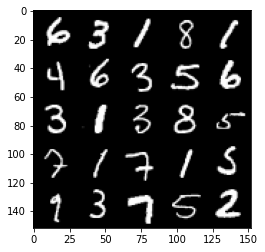

  0%|          | 0/469 [00:00<?, ?it/s]

Step 76500: Generator loss: 1.4618022966384887, discriminator loss: 0.4181503841876987


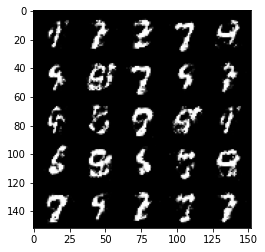

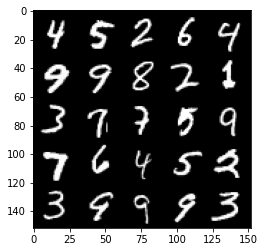

  0%|          | 0/469 [00:00<?, ?it/s]

Step 77000: Generator loss: 1.5233115489482894, discriminator loss: 0.4199192147254943


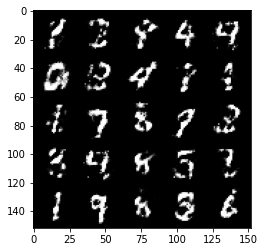

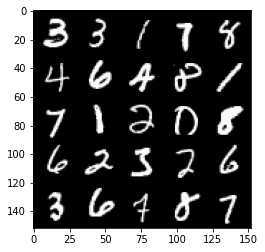

  0%|          | 0/469 [00:00<?, ?it/s]

Step 77500: Generator loss: 1.518015635967255, discriminator loss: 0.41286888813972455


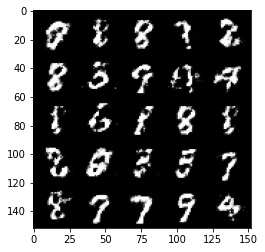

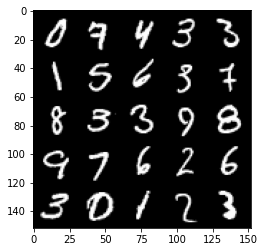

  0%|          | 0/469 [00:00<?, ?it/s]

Step 78000: Generator loss: 1.4026634621620173, discriminator loss: 0.4420714750885962


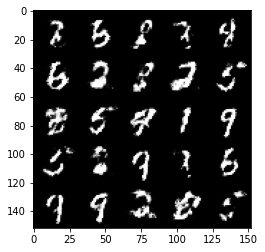

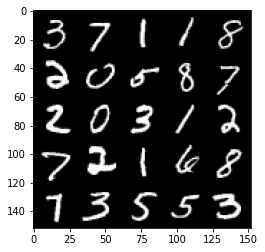

  0%|          | 0/469 [00:00<?, ?it/s]

Step 78500: Generator loss: 1.383750914812088, discriminator loss: 0.44814496177434926


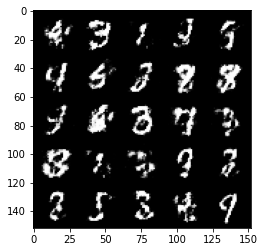

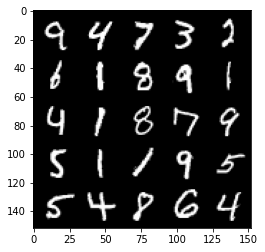

  0%|          | 0/469 [00:00<?, ?it/s]

Step 79000: Generator loss: 1.39715890431404, discriminator loss: 0.43504260498285297


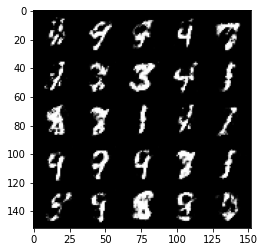

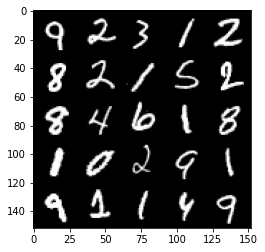

  0%|          | 0/469 [00:00<?, ?it/s]

Step 79500: Generator loss: 1.36849036860466, discriminator loss: 0.4546350531578064


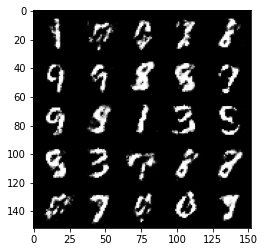

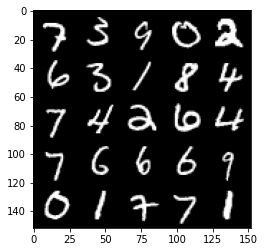

  0%|          | 0/469 [00:00<?, ?it/s]

Step 80000: Generator loss: 1.2968303911685946, discriminator loss: 0.4727377086877827


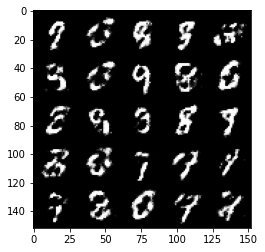

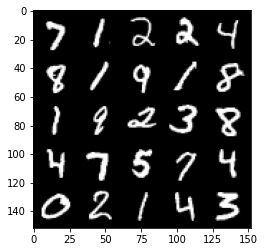

  0%|          | 0/469 [00:00<?, ?it/s]

Step 80500: Generator loss: 1.405027042150498, discriminator loss: 0.4373702023029329


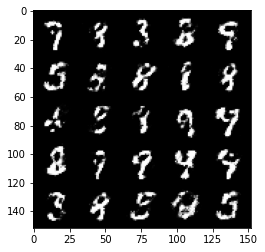

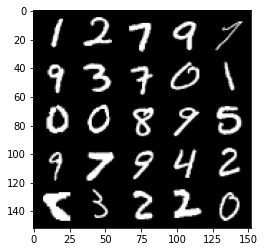

  0%|          | 0/469 [00:00<?, ?it/s]

Step 81000: Generator loss: 1.3488073885440828, discriminator loss: 0.4645279117822644


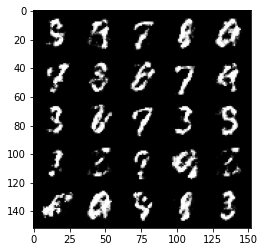

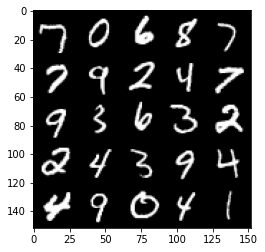

  0%|          | 0/469 [00:00<?, ?it/s]

Step 81500: Generator loss: 1.3891776771545423, discriminator loss: 0.4400067285299299


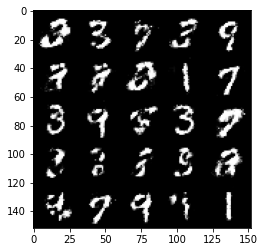

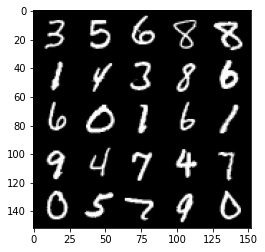

  0%|          | 0/469 [00:00<?, ?it/s]

Step 82000: Generator loss: 1.3641324534416186, discriminator loss: 0.44882998234033566


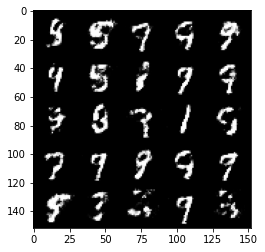

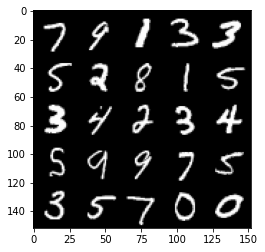

  0%|          | 0/469 [00:00<?, ?it/s]

Step 82500: Generator loss: 1.3334473958015443, discriminator loss: 0.458085276544094


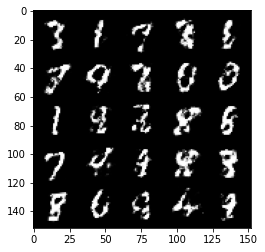

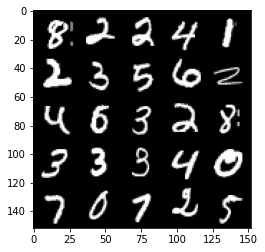

  0%|          | 0/469 [00:00<?, ?it/s]

Step 83000: Generator loss: 1.2997514162063588, discriminator loss: 0.46598378068208685


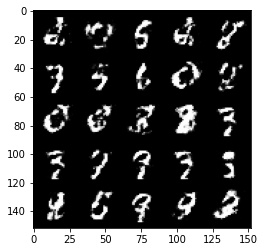

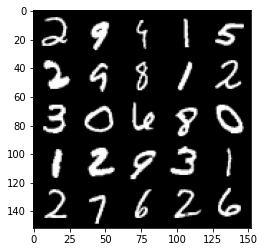

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 83500: Generator loss: 1.3648374423980711, discriminator loss: 0.46152803665399544


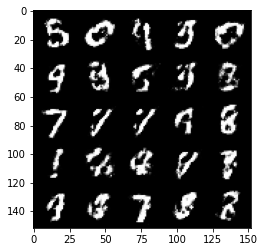

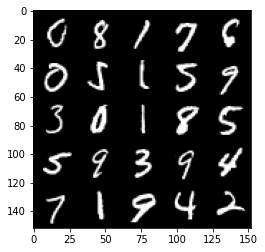

  0%|          | 0/469 [00:00<?, ?it/s]

Step 84000: Generator loss: 1.3041076300144194, discriminator loss: 0.4748738875389097


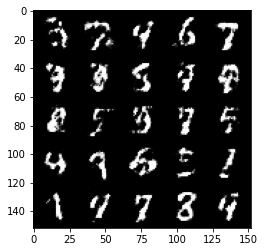

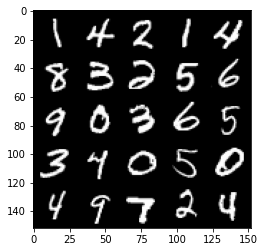

  0%|          | 0/469 [00:00<?, ?it/s]

Step 84500: Generator loss: 1.22103390955925, discriminator loss: 0.5016883222460746


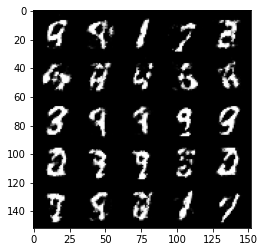

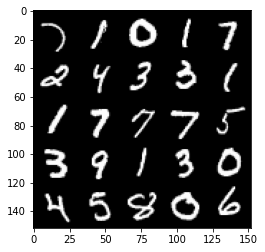

  0%|          | 0/469 [00:00<?, ?it/s]

Step 85000: Generator loss: 1.2465963361263277, discriminator loss: 0.4864460150003435


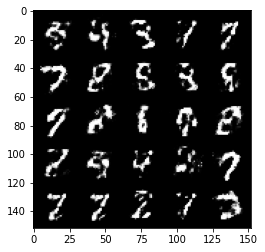

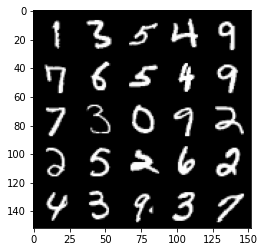

  0%|          | 0/469 [00:00<?, ?it/s]

Step 85500: Generator loss: 1.2525539600849156, discriminator loss: 0.4888417823314661


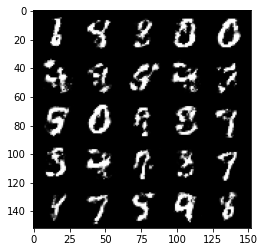

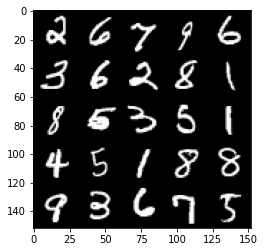

  0%|          | 0/469 [00:00<?, ?it/s]

Step 86000: Generator loss: 1.2945566315650954, discriminator loss: 0.46529255974292755


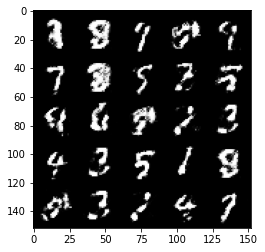

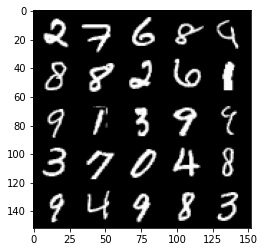

  0%|          | 0/469 [00:00<?, ?it/s]

Step 86500: Generator loss: 1.2698197071552284, discriminator loss: 0.4829505559802057


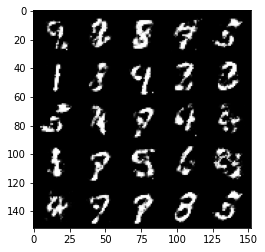

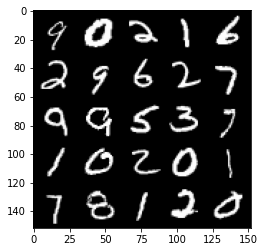

  0%|          | 0/469 [00:00<?, ?it/s]

Step 87000: Generator loss: 1.239986144781114, discriminator loss: 0.4920653982162476


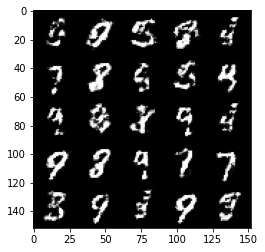

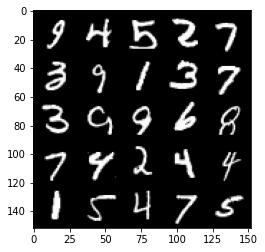

  0%|          | 0/469 [00:00<?, ?it/s]

Step 87500: Generator loss: 1.2569651732444758, discriminator loss: 0.49044400656223314


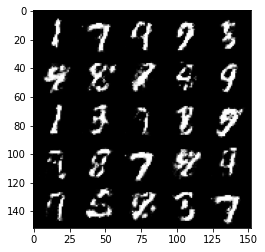

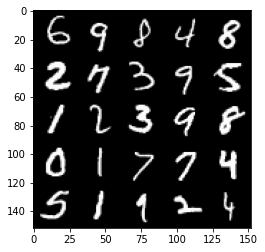

  0%|          | 0/469 [00:00<?, ?it/s]

Step 88000: Generator loss: 1.210148612976074, discriminator loss: 0.5065020986199378


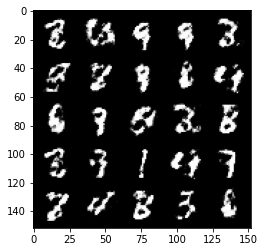

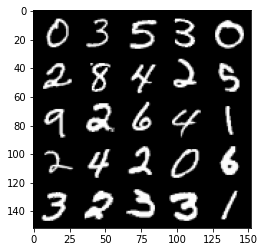

  0%|          | 0/469 [00:00<?, ?it/s]

Step 88500: Generator loss: 1.2575552740097047, discriminator loss: 0.47811769062280596


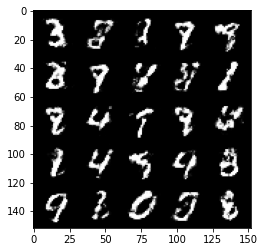

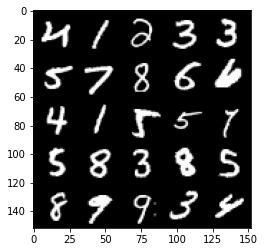

  0%|          | 0/469 [00:00<?, ?it/s]

Step 89000: Generator loss: 1.3259773385524751, discriminator loss: 0.45731854510307307


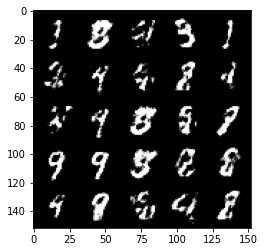

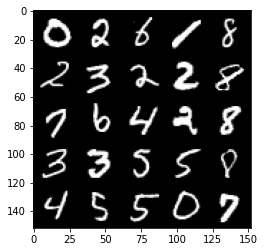

  0%|          | 0/469 [00:00<?, ?it/s]

Step 89500: Generator loss: 1.208876371145249, discriminator loss: 0.4953449705839156


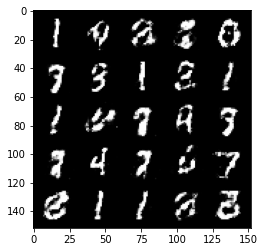

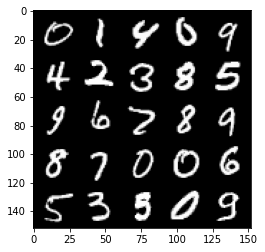

  0%|          | 0/469 [00:00<?, ?it/s]

Step 90000: Generator loss: 1.2282960884571075, discriminator loss: 0.49166098010539994


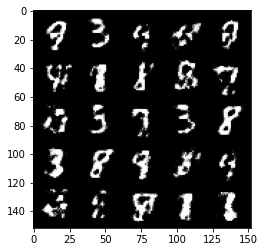

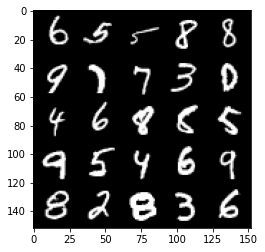

  0%|          | 0/469 [00:00<?, ?it/s]

Step 90500: Generator loss: 1.3225543963909157, discriminator loss: 0.45147287750244125


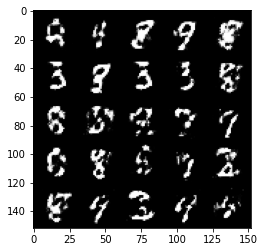

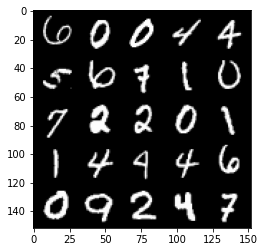

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 91000: Generator loss: 1.3301375665664676, discriminator loss: 0.4524143015146252


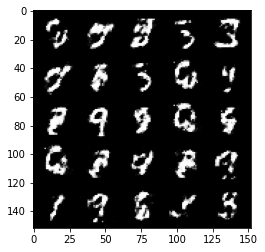

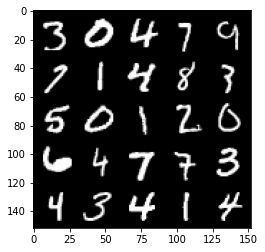

  0%|          | 0/469 [00:00<?, ?it/s]

Step 91500: Generator loss: 1.2518093945980064, discriminator loss: 0.4748360182046887


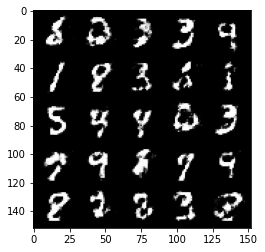

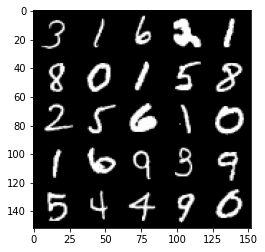

  0%|          | 0/469 [00:00<?, ?it/s]

Step 92000: Generator loss: 1.2602887070178983, discriminator loss: 0.47624625635147066


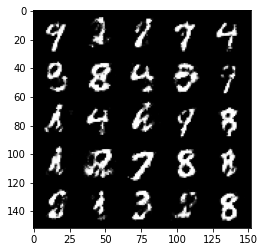

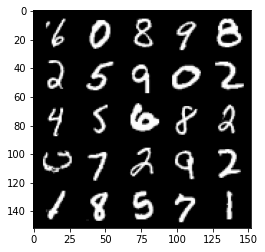

  0%|          | 0/469 [00:00<?, ?it/s]

Step 92500: Generator loss: 1.22490618801117, discriminator loss: 0.49446528971195225


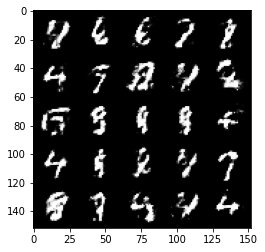

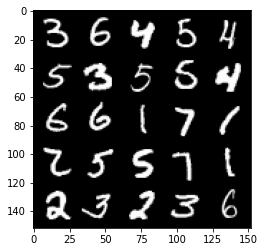

  0%|          | 0/469 [00:00<?, ?it/s]

Step 93000: Generator loss: 1.256057094335556, discriminator loss: 0.47755573183298095


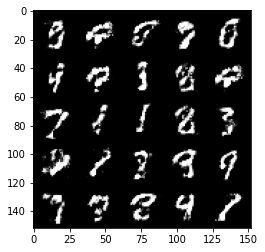

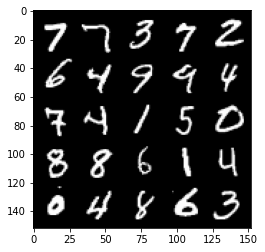

  0%|          | 0/469 [00:00<?, ?it/s]

Step 93500: Generator loss: 1.2874571611881247, discriminator loss: 0.4731577732563019


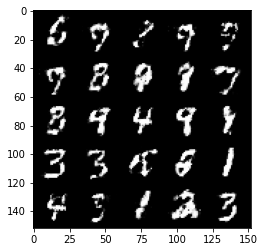

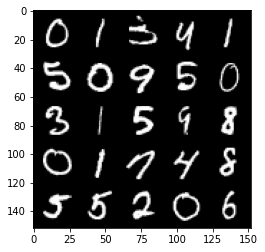

In [ ]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Si el generador debe ser probado
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader devuelve los lotes
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Aplane el lote de imágenes reales del conjunto de datos
        real = real.view(cur_batch_size, -1).to(device)

        ### Actualizar el discriminador ###
        # Poner a cero los gradientes antes de la retropropagación
        disc_opt.zero_grad()

        # Calcular la pérdida del discriminador 
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Actualizar gradientes
        disc_loss.backward(retain_graph=True)

        # Actualizar optimizador
        disc_opt.step()

        # Con fines de prueba, para realizar un seguimiento de los pesos del generador
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Actualizar generador ###
        #     Sugerencia: ¡Este código se parecerá mucho a las actualizaciones del discriminador!
        #     Estos son los pasos que deberá completar:
        #       1) Ponga a cero los gradientes.
        #       2) Calcule la pérdida del generador, asignándola a gen_loss.
        #       3) Backprop a través del generador: actualice los gradientes y el optimizador.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward(retain_graph=True)
        gen_opt.step()
        #### END CODE HERE ####

        # Con fines de prueba, para verificar que el código cambie los pesos del generador
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Realice un seguimiento de la pérdida promedio del discriminador
        mean_discriminator_loss += disc_loss.item() / display_step

        # Lleve un registro de la pérdida promedio del generador
        mean_generator_loss += gen_loss.item() / display_step

        ### Código de visualización ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1